In [1]:
###################################################
#### Code to analyze trajectories              ####
#### By Ehsan Erfani   @UW,  2022              ####
###################################################

import datetime as dt
import numpy as np
import os
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
import pandas as pd
from itertools import cycle
from geographiclib.geodesic import Geodesic
import time
import matplotlib
matplotlib.use('Agg')
%matplotlib inline
from pandas import Series, DataFrame
from netCDF4 import Dataset
from math import log10
from scipy import interpolate
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
from datetime import timedelta
import seaborn as sb

import les_utils
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression

from global_land_mask import globe

## Define Parameters

In [4]:
camp ='NEP'
dn ='./'
date = '20180601'
HH='09'

traj_t = 48

traj_dirc    = ['forward']  ## trajectory direction, options: 'forward', 'backward'
start_row = 0  # drop headers of trajectory data

i_hr  = 5
i_lat = 9
i_lon = 10

## Parameters for iterative runs:
YYYY = ['2018', '2019', '2020', '2021']
MM   = ['06', '07', '08']
DD   = [30  , 31  , 31]

traj_locs     = ['01', '02', '03', '04', '05', '06'] 
traj_labels   = ['North', 'GPCI S12', 'GPCI S11', 'GPCI S10', 'GPCI S09', 'Sandu 2010']
traj_loc_longs= ['(37.7 N, 131.4 W): A location towards the northern edge of the NEP Sc deck', \
                 '(35.0 N, 125.0 W): GPCI-S12 location in Lewis (2016)', \
                 '(32.0 N, 129.0 W): GPCI-S11 location in Lewis (2016)', \
                 '(29.0 N, 133.0 W): GPCI-S10 location in Lewis (2016)', \
                 '(26.0 N, 137.0 W): GPCI-S09 location in Lewis (2016)', \
                 '(25.0 N, 125.0 W): NEP location in Sandu et al. (2010)']

## All Trajectories

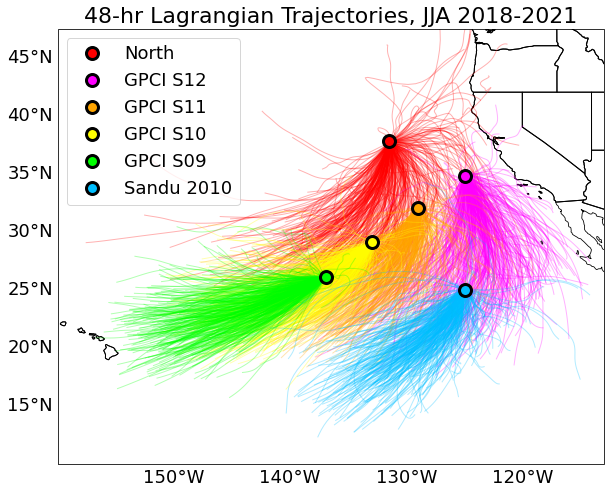

In [3]:
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
proj    = ccrs.PlateCarree()
traj_t  = 48
######
fig   = plt.figure(figsize=(12,8))
ax    = plt.axes(projection = proj)

    
for i, traj_loc in enumerate(traj_locs):
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]

                if traj_dirc == ['forward', 'backward']:
                    btr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                          + date + HH + '00.airmass_trajectories_500m_-48.txt'

                    df_btr  = pd.read_fwf(btr, delimiter = " ")
                    arr_btr = df_btr[start_row:].to_numpy()
                    lat_btr = arr_btr[:traj_t+1,i_lat]
                    lon_btr = arr_btr[:traj_t+1,i_lon]
                
                #####
                cf_f  = ax.plot(lon_ftr, lat_ftr, '-', color=colors[i], linewidth=1, transform = ccrs.PlateCarree(), \
                               alpha=0.3)#, solid_capstyle="butt")
                #cf_f1 = ax.scatter(lon_ftr[0:-1:6], lat_ftr[0:-1:6], marker='o', color='darkblue', s=40, transform = ccrs.PlateCarree())
                if traj_dirc == ['forward', 'backward']:
                    cf_b  = ax.plot(lon_btr, lat_btr, '-', color=colors[i], linewidth=5, transform = ccrs.PlateCarree())
                #    cf_b1 = ax.scatter(lon_btr[0:-1:6], lat_btr[0:-1:6], marker='o', color='cyan', s=40, transform = ccrs.PlateCarree())

for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = plt.plot(start_point[1], start_point[0],label=traj_labels[i], marker='o', c=colors[i], markeredgecolor='k', \
                     markersize=12, markeredgewidth=3, linestyle = 'None', transform=ccrs.PlateCarree())#   , edgecolor='k', linewidth=3, )#  s=100, 
                      
ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}
#    legend.get_frame().set_alpha(None)

legend = ax.legend(fontsize=18)    
plt.savefig('Trajectories.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## All trajectories with net equatorward movement
## that are NOT near the US/Mexico west coastlines

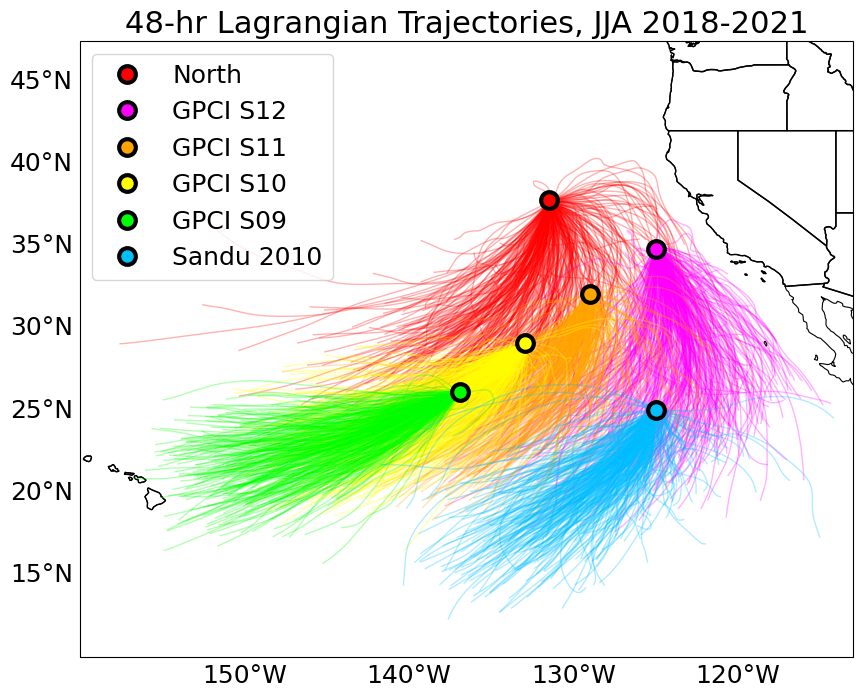

In [3]:
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
proj    = ccrs.PlateCarree()
traj_t  = 48
######
fig   = plt.figure(figsize=(12,8))
ax    = plt.axes(projection = proj)

nn = 0

for i, traj_loc in enumerate(traj_locs):
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]
                
                start_point = [lat_ftr[0], lon_ftr[0]]
                end_point   = [lat_ftr[-1], lon_ftr[-1]]
                
                if start_point[0]> end_point[0]:
                    
                    if (np.nansum( globe.is_land(lat_ftr    , lon_ftr + 1) ) == 0 and  \
                        np.nansum( globe.is_land(lat_ftr + .25, lon_ftr + 1) ) == 0 and \
                        np.nansum( globe.is_land(lat_ftr - .25, lon_ftr + 1) ) == 0) or \
                       (np.nansum(lon_ftr < -150) > 0):
                       
                        nn += 1                    
                        cf_f  = ax.plot(lon_ftr, lat_ftr, '-', color=colors[i], linewidth=1, transform = ccrs.PlateCarree(), \
                                       alpha=0.3)
                    
for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = plt.plot(start_point[1], start_point[0],label=traj_labels[i], marker='o', c=colors[i], markeredgecolor='k', \
                     markersize=12, markeredgewidth=3, linestyle = 'None', transform=ccrs.PlateCarree())
                      
ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}

legend = ax.legend(fontsize=18)    
plt.savefig('Trajectories.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

In [5]:
print(nn)

2105


## Retrieving trajectory variables for PCA

In [3]:
def extract_traj_vars(camp='NEP', dn='./', date='20180601', HH='09', t_strt='09', del_t=48, traj_dirc=['forward']):
    
    # date
    my_date = dt.datetime.strptime(date,'%Y%m%d')
    YYYY = str(my_date.year)
    MM   = f"{my_date.month:02d}"
    DD   = f"{my_date.day:02d}"

    idx_strt = int(t_strt) - int(HH)

    ##### read trajectory files
    MERRA_data = Dataset('/home/disk/eos3/erfani/Data/'+camp+'/Lagrangian_project/'+dn+'st' + '_72h_forward_' + traj_loc + '_' + date + '.nc')
    if traj_dirc == ['forward', 'backward']:
        MERRA_datab = Dataset('/home/disk/eos3/erfani/Data/'+camp+'/Lagrangian_project/'+dn+'st' + '_48h_backward_' + traj_loc + '_' + date + '.nc')

    #### Parameters
    ylim      = 4000
    init_time = YYYY + '-' + MM + '-' + DD + ' ' + t_strt + 'Z'

    zen_cut = 75 # do not consider CERES/GOES variables, when zenith angle is greater than cut-off

    start_row = 0  # drop headers of trajectory data


    ###############################################################
    ### Calculate inversion height (min of dtheta/dz * dRH/dz)

    ## find delta after calculating mid-point values
    def delta(THETA):
        nz = THETA.shape[1]
        THETAi = np.arange(THETA.shape[0] * (nz+1)).reshape(THETA.shape[0], nz+1).astype(float)
        THETAi[:] = np.nan
        THETAi[:,0] = 0
        THETAi[:,1:nz] = 0.5 * (THETA[:,:nz-1] + THETA[:,1:nz])
        THETAi[:,nz] = 1.5 * THETA[:,nz-1] - 0.5 * THETA[:,nz-2]
        d_THETA = THETAi[:,1:] - THETAi[:,:-1]
        return d_THETA

    def inv_h(THETA, RH, dzz, zz):        
        d_THETA = THETA[:,1:] - THETA[:,:-1]
        d_RH = RH[:,1:] - RH[:,:-1]

        ZINV = d_THETA[:,0].copy()
        ZINV[:] = np.nan
        for i in range(d_THETA.shape[0]):
            z  = zz[i,:]  if len(zz.shape) > 1 else zz
            dz = dzz[i,:] if len(zz.shape) > 1 else dzz
            dTHETA_dz = d_THETA[i,:] / dz[1:]
            dRH_dz = d_RH[i,:] / dz[1:]
            dTHETA_dz[dTHETA_dz < 0] = 0
            dRH_dz[dRH_dz > 0] = 0    
            func = dTHETA_dz * dRH_dz
            if len(zz.shape) > 1:
                indx = np.max(np.where(func == np.nanmin(func))[0])
            else:
                indx = np.min(np.where(func == np.nanmin(func))[0])                    
            # approximate func as a parabola around the minimum and find the height where that parabola is minimized. 
            # This will allow the inversion height to vary continuously as the input profiles change.
            # inversion_test is defined at midpoints of grid
            zavg = 0.5 * (z[:-1] + z[1:])
            rnge = range(indx-1, indx+2)
            # we define the parabola, converting from m to km.
            pp = np.polyfit(1e-3 * zavg[rnge], func[rnge], 2)
            # take the derivative of the parabola in coeffient space.
            pp_prime = np.array([2 * pp[0], pp[1]]) # this is its derivative
            # find the zero-crossing of the derivative. This is the inversion height in meters
            z_inv = -1e3 * pp_prime[1] / pp_prime[0]         
            ZINV[i] = z_inv
        return ZINV

    def mbl_ave_MERRA(MERRA_Na, ERA_ZINV, dz_MERRA):
        MERRA_Na_mean2 = MERRA_Na[:,0].copy()
        MERRA_Na_mean2[:] = np.nan
        for i in range(MERRA_Na_mean2.size):
            jjj = np.where(abs(MERRA_H[i,:] - ERA_ZINV[i]) == np.nanmin(abs(MERRA_H[i,:] - ERA_ZINV[i])))[0][0]
            MERRA_Na_mean2[i] = np.nansum(MERRA_RHO[i,jjj:] * MERRA_Na[i,jjj:] * dz_MERRA[i,jjj-1:])\
            / np.nansum(MERRA_RHO[i,jjj:] * dz_MERRA[i,jjj-1:])
        return MERRA_Na_mean2

    ## Find the index of model time when aircraft passes
    def model_index(time, t_flight):
        iii = np.where(abs(time - t_flight) == np.nanmin(abs(time - t_flight)))[0][0]
        return iii


    ##############################################################################
    ### Read various satellite and reanalysis variables from trajectory files

    ## Concatenate a variable from forward and backward trajectories
    def read_var_1D(var_name):
        if traj_dirc == ['forward', 'backward']:
            var = np.concatenate( ( MERRA_datab.variables[var_name][(-HH+1):], \
                                  MERRA_data.variables[var_name][:del_t]), axis=0)
        else:
            var = MERRA_data.variables[var_name][idx_strt:del_t+idx_strt]
        return var

    def read_var_2D(var_name):
        if traj_dirc == ['forward', 'backward']:
            var = np.concatenate( ( MERRA_datab.variables[var_name][(-HH+1):,:], \
                                  MERRA_data.variables[var_name][:del_t]), axis=0)
        else:
            var = MERRA_data.variables[var_name][idx_strt:del_t+idx_strt,:]
        return var



    ### CERES
    CERES_zenith  = read_var_1D('CERES_solar_zen_angle_1h')   # Cloud Top Height - Low clouds    
    cut_var  = CERES_zenith.copy()
    cut_var[:] = 1.0
    cut_var[CERES_zenith > zen_cut] = np.nan

    CERES_lwp     = read_var_1D('CERES_lwp_low_1h') * cut_var      # Liquid Water Path - Low clouds: g/m2
    CERES_lwp_tot = read_var_1D('CERES_lwp_total_1h') * cut_var    # Liquid Water Path - total clouds: g/m2
    CERES_iwp     = read_var_1D('CERES_iwp_low_1h') * cut_var      # ice Water Path - Low clouds: g/m2
    CERES_iwp_tot = read_var_1D('CERES_iwp_total_1h') * cut_var    # ice Water Path - total clouds: g/m2
    CERES_cld     = read_var_1D('CERES_cldarea_low_1h')   # Cloud Area Fraction - Low clouds: %
    CERES_cld_tot = read_var_1D('CERES_cldarea_total_1h') # Cloud Area Fraction - total clouds: %
    CERES_t_sw    = read_var_1D('CERES_toa_sw_all_1h')    # Observed TOA Shortwave Flux - All-sky: w/m2
    CERES_t_lw    = read_var_1D('CERES_toa_lw_all_1h')    # Observed TOA Longwave  Flux - All-sky: w/m2
    CERES_t_si    = read_var_1D('CERES_toa_solar_all_1h') # Observed TOA Solar Insolation Flux - All-sky: w/m2
    CERES_s_lwu   = read_var_1D('CERES_adj_atmos_lw_up_all_surface_1h')   # Adjusted All-Sky Profile Fluxes Longwave Flux Up - Surface: w/m2
    CERES_s_lwd   = read_var_1D('CERES_adj_atmos_lw_down_all_surface_1h') # Adjusted All-Sky Profile Fluxes Longwave Flux Down - Surface: w/m2
    CERES_s_swu   = read_var_1D('CERES_adj_atmos_sw_up_all_surface_1h')   # Adjusted All-Sky Profile Fluxes Shortgwave Flux Up - Surface: w/m2
    CERES_s_swd   = read_var_1D('CERES_adj_atmos_sw_down_all_surface_1h') # Adjusted All-Sky Profile Fluxes Shortwave Flux Down - Surface: w/m2
    CERES_tau     = read_var_1D('CERES_cldtau_low_1h')    * cut_var       # Cloud Visible Optical Depth - Low clouds
    CERES_re      = read_var_1D('CERES_cldwatrad_low_1h') * cut_var       # 
    CERES_Nd      = read_var_1D('CERES_Nd')               * cut_var       # cm**-3      

    CERES_s_lw    = CERES_s_lwu - CERES_s_lwd
    CERES_s_sw    = CERES_s_swd - CERES_s_swu
    CERES_t_si2   = CERES_t_si.copy()
    CERES_t_si2[CERES_t_si2 <= 100] = np.nan
    CERES_albd    = (CERES_t_si2 - CERES_t_sw) / CERES_t_si2
    CERES_albd2   = CERES_t_sw / CERES_t_si2
    CERES_t_sw_std     = read_var_1D('CERES_toa_sw_all_1h_std')    # std of Observed TOA Shortwave Flux - All-sky: w/m2
    CERES_t_sw_clr     = read_var_1D('CERES_toa_sw_clr_1h')        # Observed TOA Shortwave Flux - Clear-sky: w/m2
    CERES_t_sw_clr_std = read_var_1D('CERES_toa_sw_clr_1h_std')    # std of Observed TOA Shortwave Flux - All-sky: w/m2

    CERES_sw_cre      = read_var_1D('CERES_sw_cre') 
    CERES_sw_cre_std  = read_var_1D('CERES_sw_cre_std') 
    #     CERES_sw_cre_t    = CERES_t_sw - CERES_t_sw_clr
    #     CERES_sw_cre_std_t= abs(CERES_t_sw_std - CERES_t_sw_clr_std) 
    CERES_cld_std     = read_var_1D('CERES_cldarea_low_1h_std') # * cut_var  # std of Cloud Area Fraction - Low clouds: %
    CERES_cld_tot_std = read_var_1D('CERES_cldarea_total_1h_std')   # std of Cloud Area Fraction - total clouds: %
    CERES_lwp_std     = read_var_1D('CERES_lwp_low_1h_std') * cut_var  # std of Liquid Water Path - Low clouds: g/m2
    CERES_lwp_tot_std = read_var_1D('CERES_lwp_total_1h_std') * cut_var  # std of Liquid Water Path - total clouds: g/m2
    CERES_iwp_std     = read_var_1D('CERES_iwp_low_1h_std') * cut_var  # std of Liquid Water Path - Low clouds: g/m2
    CERES_iwp_tot_std = read_var_1D('CERES_iwp_total_1h_std') * cut_var  # std of Liquid Water Path - total clouds: g/m2
    CERES_t_lw_std    = read_var_1D('CERES_toa_lw_all_1h_std')      # Observed TOA Longwave Flux - All-sky, , standard deviation over box: w/m2
    CERES_toa_alb     = read_var_1D('CERES_toa_alb_all_1h')    
    CERES_toa_alb_std = read_var_1D('CERES_toa_alb_all_1h_std')    
    CERES_tau_std     = read_var_1D('CERES_cldtau_low_1h_std')    * cut_var   # Cloud Visible Optical Depth - Low clouds
    CERES_re_std      = read_var_1D('CERES_cldwatrad_low_1h_std') * cut_var   # 

    CERES_CTH     = read_var_1D('CERES_cldhght_top_low_1h') * 1000       # Cloud Top Height - Low clouds
    CERES_CTH_std = read_var_1D('CERES_cldhght_top_low_1h_std') * 1000   #


    ### SSMI
    SSMI_WVP   = read_var_1D('SSMI_WVP')   # Columnar Water Vapor: mm
    SSMI_lwp   = read_var_1D('SSMI_LWP')   # Cloud Liquid Water: mm
    SSMI_WSPD  = read_var_1D('SSMI_WSPD')  # 10m Surface Wind Speed
    SSMI_lwp_std = read_var_1D('SSMI_LWP_std')  # Cloud Liquid Water standard deviation over box: mm
    AMSR_lwp   = read_var_1D('AMSR_LWP')        # Cloud Liquid Water: mm
    AMSR_lwp_std = read_var_1D('AMSR_LWP_std')  # Cloud Liquid Water standard deviation over box: mm


    ### MERRA
    if traj_dirc == ['forward', 'backward']:
        MERRA_time2 = np.concatenate( ( (MERRA_datab.variables['time'][(-HH+1):] - MERRA_datab.variables['time'][-HH+1]) / 24, \
                                  (MERRA_data.variables['time'][:del_t] + HH) / 24), axis=0)
                                    #time of measurement: seconds since 2015-07-17T17:00:00+00:00
    else:
        MERRA_time2 = MERRA_data.variables['time'][idx_strt:del_t+idx_strt] - idx_strt

    MERRA_RHO       = read_var_2D('MERRA_AIRDENS')                 # air_density: kg/m3                     
    MERRA_Na        = read_var_2D('MERRA_Na_tot') / MERRA_RHO      # total aerosol from MERRA
    MERRA_Na_corr   = read_var_2D('MERRA_Na_tot_corr') / MERRA_RHO # total aerosol number concentration, >100 um, corrected to aircraft
    MERRA_H         = read_var_2D('MERRA_H')                       # mid_layer_heights

    dz_MERRA        = MERRA_H.copy()
    dz_MERRA[:]     = np.nan
    dz_MERRA[:,1:]  = MERRA_H[:,:-1] - MERRA_H[:,1:]

    MERRA_H_mg, MERRA_time_mg = np.meshgrid(MERRA_H[0,:], MERRA_time2)    # making meshgrid


    ### AMSR
    AMSR_prec     = read_var_1D('AMSR_prcp_mean') * 24 # AMSR Tb mean rain rate: converted to mm/day
    AMSR_prep_std = read_var_1D('AMSR_prcp_std') * 24  # AMSR Tb rain rate standard deviation: : converted to mm/day

    ### MODIS CTH
    MODIS_CTH     = read_var_1D('MODIS_CTH') * 1000  # MODIS cloud top height, box mean: converted to m
    MODIS_CTH_std = read_var_1D('MODIS_CTH_std') * 1000  # MODIS cloud top height, box standard deviation: converted to m

    MODIS_CTH    [MODIS_CTH > 2500] = np.nan
    MODIS_CTH_std[MODIS_CTH > 2500] = np.nan
    ## Calculate accumulated precip
    #AMSR_acc_R = AMSR_prec.copy()
    #AMSR_acc_R[:] = np.nan
    #for i in range(len(AMSR_acc_R)):
    #    AMSR_acc_R[i] = np.nansum(AMSR_prec[:i+1]) / (MERRA_time2[-1] * 24) 

    ### ERA
    ERA_sshf = - read_var_1D('ERA_sshf')      # Instantaneous surface sensible heat flux: W/m2
    ERA_slhf = - read_var_1D('ERA_slhf')      # Instantaneous surface sensible heat flux: W/m2
    ERA_lcc  = read_var_1D('ERA_lcc') * 100   # Low cloud cover: convert to %
    ERA_lev  = MERRA_data.variables['level'][:] # air_pressure: mb
    ERA_z    = read_var_2D('ERA_z') / 10      # geopotential: converted from m**2 s**-2 to m
    ERA_t    = read_var_2D('ERA_t')           # air_temperature: K
    ERA_q    = read_var_2D('ERA_q') * 1000    # specific_humidity: converted to g/kg
    ERA_r    = read_var_2D('ERA_r')           # relative_humidity: %
    ERA_LTS  = read_var_1D('ERA_LTS')         # Lower Tropospheric Stability: K
    ERA_blh  = read_var_1D('ERA_blh')         # Boundary layer height: m
    ERA_cc   = read_var_2D('ERA_cc') * 100    # Fraction of cloud cover: converted to %
    ERA_crwc = read_var_2D('ERA_crwc') * 1000 # Specific rain water content: converted to g kg**-1
    ERA_clwc = read_var_2D('ERA_clwc') * 1000 # Specific cloud water content: converted to g kg**-1
    ERA_wc   = ERA_crwc + ERA_clwc            # liquid water mixing ratio (rain water + liquid cloud water)
    ERA_qt   = ERA_wc   + ERA_q
    ERA_ciwc = read_var_2D('ERA_ciwc') * 1000 # Specific rain water content: converted to g kg**-1
    ERA_cswc = read_var_2D('ERA_cswc') * 1000 # Specific cloud water content: converted to g kg**-1
    ERA_ic   = ERA_ciwc + ERA_cswc            # liquid water mixing ratio (rain water + liquid cloud water)

    ERA_z_mg, ERA_time_mg = np.meshgrid(ERA_z[0,:], MERRA_time2) # making meshgrid
    ERA_lev_mg, dummy = np.meshgrid(ERA_lev, MERRA_time2) # making meshgrid

    # calculate ERA5 Theta:
    Rd_cp = 0.286
    ERA_THETA = ERA_t * (1000 / ERA_lev_mg) ** (Rd_cp)

    MERRA_alt = np.nanmean(MERRA_H, 0)


    ## ERA5
    Cp = 1005.7 # specific heat of dry air at constant pressure: J/kg/K
    Lv = 2.5e6  # latent heat of vaporization: J/kg
    ERA_THETAL = ERA_THETA - (ERA_THETA / ERA_t) * (Lv / Cp) * ERA_wc / 1000

    ##############################  
    ## Calc. ERA inversion height
    #dz_ERA  = delta(ERA_z)
    dz_ERA  = ERA_z.copy()
    dz_ERA[:] = np.nan
    dz_ERA[:,1:] = ERA_z[:,1:] - ERA_z[:,:-1]
    try:
        ERA_ZINV= inv_h(ERA_THETAL, ERA_r, dz_ERA, ERA_z)
    except:
        pass
    ERA_ZINV = ERA_blh

    ## Calculate the index of BL: find index where z is equal to ZINV
    MERRA_inv_idx = np.arange(len(ERA_ZINV))
    MERRA_inv_idx[:] = int(0)
    for i in range(len(ERA_ZINV)):
        diff = abs(MERRA_H[i,:] - ERA_ZINV[i])
        MERRA_inv_idx[i] = np.where(diff == np.min(diff))[0][0]  


    ############################################
    ##### Calculate ERA5 water path
    def ERA_LWP(var, ERA_z):
        delta_ERA_z = delta(ERA_z[:,::-1])[:,::-1]
        #delta_ERA_z = ERA_z[:,0:-1] - ERA_z[:,1:]
        ERA_lwp = var[:,0].copy()
        ERA_lwp[:] = np.nan
        ERA_RHO = var.copy()
        ERA_RHO[:] = np.nan
        for i in range(ERA_RHO.shape[0]):
            ERA_RHO[i,:] = np.interp(ERA_z[i,:], MERRA_H[i,:], MERRA_RHO[i,:])
        for i in range(delta_ERA_z.shape[0]):
            ERA_lwp[i] = np.nansum(var[i,:] * delta_ERA_z[i,:] * ERA_RHO[i,:]) # / np.nansum(delta_ERA_z2[i, :])
        return ERA_lwp

    ERA_clwp = ERA_LWP(ERA_clwc, ERA_z)
    ERA_crwp = ERA_LWP(ERA_crwc, ERA_z)

    ERA_ciwp = ERA_LWP(ERA_ciwc, ERA_z)
    ERA_cswp = ERA_LWP(ERA_cswc, ERA_z)


    ################ MERRA:
    dz_MERRA = MERRA_H[:,:-1] - MERRA_H[:,1:]
    MERRA_Na_mean      = mbl_ave_MERRA(MERRA_Na, ERA_ZINV, dz_MERRA)
    MERRA_Na_corr_mean = mbl_ave_MERRA(MERRA_Na_corr, ERA_ZINV, dz_MERRA)

    ### Retrieve additional ERA5 variables 
    ERA_EIS  = read_var_1D('ERA_EIS')          # Estimated Inversion Stability: K
    ERA_u10  = read_var_1D('ERA_u10')          # 10 metre U wind component: m/s
    ERA_v10  = read_var_1D('ERA_v10') 
    ERA_SST  = read_var_1D('ERA_sst') - 273.15 # Sea surface temperature: deg C
    ERA_w    = read_var_2D('ERA_w')            # Vertical velocity: Pa/s
    ERA_Pmsl = read_var_1D('ERA_sp') / 100     # Surface pressure: hPa

    ERA_WS10 = (ERA_u10 ** 2 + ERA_v10 ** 2) ** .5

    level = 700
    i_lev = np.where(ERA_lev == level)[0][0]
    ERA_q_700 = ERA_q[:,i_lev]
    ERA_w_700 = ERA_w[:,i_lev]
    
    MERRA_lev  = MERRA_data.variables['lev'][:]
    i_lev = np.where(MERRA_lev == level)[0][0]
    MERRA_Na_700 = MERRA_Na[:,i_lev]
    
    return ERA_WS10, ERA_EIS, ERA_q_700, ERA_w_700, ERA_SST, ERA_Pmsl, \
           CERES_cld, CERES_lwp, CERES_Nd, CERES_CTH, AMSR_lwp * 1000, \
           SSMI_lwp * 1000, MODIS_CTH, MERRA_Na_mean, CERES_iwp_tot, AMSR_prec, MERRA_Na_700

In [29]:
# nn = 0

# def create_var(): 
#     var1 = np.zeros(traj_t * sum(DD) * len(YYYY) * len(traj_locs)).reshape(traj_t, sum(DD), len(YYYY), len(traj_locs))
#     var1[:] = np.nan
#     return var1

# ERA_WS10 = create_var(); ERA_EIS = create_var(); ERA_q_700 = create_var()
# ERA_w_700 = create_var(); ERA_SST = create_var(); ERA_Pmsl = create_var()
# CERES_cld = create_var(); CERES_lwp = create_var(); CERES_Nd = create_var(); CERES_CTH = create_var()
# AMSR_lwp = create_var(); SSMI_lwp = create_var(); MODIS_CTH = create_var(); MERRA_Na_m = create_var()
# CERES_iwp = create_var(); AMSR_prec = create_var(); MERRA_Na_700 = create_var()

# for i, traj_loc in enumerate(traj_locs):
#     for y1 in range(len(YYYY)):
#         for m1 in range(len(MM)):
#             for d1 in range(1, DD[m1]+1):
#                 date = YYYY[y1] + MM[m1] + f"{d1:02d}"

#                 ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
#                       + date + HH + '00.airmass_trajectories_500m_+72.txt'

#                 df_ftr  = pd.read_fwf(ftr, delimiter = " ")
#                 arr_ftr = df_ftr[start_row:].to_numpy()
#                 lat_ftr = arr_ftr[:traj_t+1,i_lat]
#                 lon_ftr = arr_ftr[:traj_t+1,i_lon]
                
#                 start_point = [lat_ftr[0], lon_ftr[0]]
#                 end_point   = [lat_ftr[-1], lon_ftr[-1]]
                
#                 if start_point[0]> end_point[0]:
                    
#                     if (np.nansum( globe.is_land(lat_ftr    , lon_ftr + 1) ) == 0 and  \
#                         np.nansum( globe.is_land(lat_ftr + .25, lon_ftr + 1) ) == 0 and \
#                         np.nansum( globe.is_land(lat_ftr - .25, lon_ftr + 1) ) == 0) or \
#                        (np.nansum(lon_ftr < -150) > 0):
                       
#                         nn += 1                    
                        
#                         d_idx = sum(DD[:m1])+d1-1
                        
#                         print(d1, MM[m1], YYYY[y1], traj_loc)
                        
#                         ERA_WS10 [:, d_idx, y1, i], ERA_EIS   [:, d_idx, y1, i],  \
#                         ERA_q_700[:, d_idx, y1, i], ERA_w_700 [:, d_idx, y1, i],  \
#                         ERA_SST  [:, d_idx, y1, i], ERA_Pmsl  [:, d_idx, y1, i],  \
#                         CERES_cld[:, d_idx, y1, i], CERES_lwp [:, d_idx, y1, i],  \
#                         CERES_Nd [:, d_idx, y1, i], CERES_CTH [:, d_idx, y1, i],  \
#                         AMSR_lwp [:, d_idx, y1, i], SSMI_lwp  [:, d_idx, y1, i],  \
#                         MODIS_CTH[:, d_idx, y1, i], MERRA_Na_m[:, d_idx, y1, i],  \
#                         CERES_iwp[:, d_idx, y1, i], AMSR_prec [:, d_idx, y1, i],  \
#                         MERRA_Na_700[:, d_idx, y1, i] = \
#                             extract_traj_vars(camp='NEP', dn='./', date=date, HH='09', t_strt='09', del_t=48, \
#                             traj_dirc=['forward'], HH=9)
                        
# ### Save to file                        
# np.savez("traj_vars_18-21_1-6.npz",ERA_WS10=ERA_WS10, ERA_EIS=ERA_EIS, ERA_q_700=ERA_q_700, ERA_w_700=ERA_w_700,\
#                                    ERA_SST=ERA_SST, ERA_Pmsl=ERA_Pmsl, CERES_cld=CERES_cld, CERES_lwp=CERES_lwp,\
#                                    CERES_Nd=CERES_Nd , CERES_CTH=CERES_CTH, AMSR_lwp=AMSR_lwp, SSMI_lwp=SSMI_lwp, \
#                                    MODIS_CTH=MODIS_CTH, MERRA_Na_m=MERRA_Na_m,CERES_iwp=CERES_iwp, AMSR_prec=AMSR_prec, \
#                                    MERRA_Na_700=MERRA_Na_700)                        

1 06 2018 01
2 06 2018 01
3 06 2018 01
4 06 2018 01
5 06 2018 01
6 06 2018 01
7 06 2018 01
8 06 2018 01
9 06 2018 01
10 06 2018 01
11 06 2018 01
12 06 2018 01
13 06 2018 01
14 06 2018 01
15 06 2018 01
16 06 2018 01
17 06 2018 01
18 06 2018 01
19 06 2018 01
20 06 2018 01
21 06 2018 01
22 06 2018 01
23 06 2018 01
24 06 2018 01
25 06 2018 01
26 06 2018 01
27 06 2018 01
28 06 2018 01
29 06 2018 01
30 06 2018 01
1 07 2018 01
2 07 2018 01
3 07 2018 01
6 07 2018 01
7 07 2018 01
8 07 2018 01
9 07 2018 01
10 07 2018 01
11 07 2018 01
12 07 2018 01
13 07 2018 01
14 07 2018 01
15 07 2018 01
16 07 2018 01
17 07 2018 01
18 07 2018 01
19 07 2018 01
20 07 2018 01
21 07 2018 01
22 07 2018 01
23 07 2018 01
24 07 2018 01
25 07 2018 01
26 07 2018 01
27 07 2018 01
28 07 2018 01
29 07 2018 01
30 07 2018 01
31 07 2018 01
1 08 2018 01
2 08 2018 01
3 08 2018 01
4 08 2018 01
10 08 2018 01
11 08 2018 01
12 08 2018 01
13 08 2018 01
14 08 2018 01
15 08 2018 01
16 08 2018 01
17 08 2018 01
18 08 2018 01
19 08 2018 0

In [4]:
### Read from file
data       = np.load('traj_vars_18-21_1-6.npz', allow_pickle=True)
ERA_WS10   = data['ERA_WS10']
ERA_EIS    = data['ERA_EIS']
ERA_q_700  = data['ERA_q_700']
ERA_w_700  = data['ERA_w_700']
ERA_SST    = data['ERA_SST']
ERA_Pmsl   = data['ERA_Pmsl']
CERES_cld  = data['CERES_cld']
CERES_lwp  = data['CERES_lwp']
CERES_Nd   = data['CERES_Nd']
CERES_CTH  = data['CERES_CTH']
AMSR_lwp   = data['AMSR_lwp']
SSMI_lwp   = data['SSMI_lwp']
MODIS_CTH  = data['MODIS_CTH']
MERRA_Na_m = data['MERRA_Na_m']
CERES_iwp  = data['CERES_iwp']
AMSR_prec  = data['AMSR_prec']
MERRA_Na_700 = data['MERRA_Na_700']

CERES_Nd[np.isinf(CERES_Nd) == 1] = np.nan
SSMI_lwp[np.isinf(SSMI_lwp) == 1] = np.nan
AMSR_lwp[np.isinf(AMSR_lwp) == 1] = np.nan
AMSR_prec[np.isinf(AMSR_prec) == 1] = np.nan

CERES_CTH = CERES_CTH / 1000
MODIS_CTH = MODIS_CTH / 1000

## Criteria to filter trajectories

In [24]:
ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            if np.nansum(np.isnan(MODIS_CTH[:,i,j,k])==0) >= 3:
                ijk += 1                
print('Number of trajectories in which MODIS CTH is available less than 3 times: ', 92* 4* 6 - ijk) 

ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            if np.nansum(np.isnan(MODIS_CTH[:,i,j,k])==0) >= 4:
                ijk += 1                
print('Number of trajectories in which MODIS CTH is available less than 4 times: ', 92* 4* 6 - ijk) 

Number of trajectories in which MODIS CTH is available less than 3 times:  367
Number of trajectories in which MODIS CTH is available less than 4 times:  706


In [25]:
ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 100)[0]
            if len(i_lwp) >= 1:
                ijk += 1
print('Number of trajectories in which IWP exceeds 100 g m-2 for more than 1 hours: ', ijk)                 

ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 50)[0]
            if len(i_lwp) >= 1:
                ijk += 1
print('Number of trajectories in which IWP exceeds 50 g m-2 for more than 1 hours: ', ijk)                 


Number of trajectories in which IWP exceeds 100 g m-2 for more than 1 hours:  439
Number of trajectories in which IWP exceeds 50 g m-2 for more than 1 hours:  702


In [26]:
ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 100)[0]
            if len(i_lwp) >= 3:
                ijk += 1
print('Number of trajectories in which IWP exceeds 100 g m-2 for more than 3 hours: ', ijk)                 

ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 50)[0]
            if len(i_lwp) >= 3:
                ijk += 1
print('Number of trajectories in which IWP exceeds 50 g m-2 for more than 3 hours: ', ijk)                 


Number of trajectories in which IWP exceeds 100 g m-2 for more than 3 hours:  243
Number of trajectories in which IWP exceeds 50 g m-2 for more than 3 hours:  442


In [27]:
ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 100)[0]
            if len(i_lwp) >= 6:
                ijk += 1
print('Number of trajectories in which IWP exceeds 100 g m-2 for more than 6 hours: ', ijk)                 

ijk = 0
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 50)[0]
            if len(i_lwp) >= 6:
                ijk += 1
print('Number of trajectories in which IWP exceeds 50 g m-2 for more than 6 hours: ', ijk)                 


Number of trajectories in which IWP exceeds 100 g m-2 for more than 6 hours:  110
Number of trajectories in which IWP exceeds 50 g m-2 for more than 6 hours:  250


## Trajectories with Ice presence

In [5]:
### Determine the trajectories with ice occurence
CERES_iwp_occur = CERES_iwp[0,:,:,:]
for i in range(MODIS_CTH.shape[1]):
    for j in range(MODIS_CTH.shape[2]):
        for k in range(MODIS_CTH.shape[3]):
            i_lwp = np.where(CERES_iwp[:,i,j,k] >= 50)[0]
            CERES_iwp_occur[i,j,k] = len(i_lwp)

## Variables averaged along trajectories

In [6]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

region = np.nanmean(ERA_SST,0).copy()
region[:] = np.nan
for ii in range(region.shape[2]):
    region[:,:,ii] = ii

region2 = region.reshape(-1)
region2 = region2[i_nonan]

def process(var):
    output = np.nanmean(var,0)
    output = output.reshape(-1)
#     output = output[~np.isnan(output)]
    output = output[i_nonan]
    return output

era5_sst_anomn_dly_t_df  = pd.DataFrame(process(ERA_SST  ), columns=['SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process(ERA_WS10 ), columns=['$WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process(ERA_Pmsl ), columns=['$P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process(ERA_q_700), columns=['$q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process(ERA_w_700), columns=['$ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process(ERA_EIS  ), columns=['EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process(CERES_cld), columns=['CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process(np.log10(CERES_lwp) ), columns=['log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process(np.log10(SSMI_lwp ) ), columns=['log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process(np.log10(AMSR_lwp ) ), columns=['log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process(np.log10(CERES_Nd) ), columns=['log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process(np.log10(MERRA_Na_m)),columns=['log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process(np.log10(MERRA_Na_700)),columns=['log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process(MODIS_CTH), columns=['MODIS CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process(CERES_CTH), columns=['CERES CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(process(np.log10(AMSR_prec) ), columns=['log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan, columns=['CERES IWP Occurence'])

df_mean = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df , era5_sst_anomn_dly_t_df ,  \
                era5_pmsl_anomn_dly_t_df,ceres_lwp_anomn_dly_t_df , ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

print(process(ERA_SST  ).reshape(-1)[~np.isnan(process(ERA_SST  ).reshape(-1))])


# ###### Plotting
# rows = df_mean.columns[0:7]
# cols = df_mean.columns[7:16]

# df_mean_ice = df_mean[df_mean['CERES IWP Occurence'] >= 3]

# ###
# fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
# for i in range(len(rows)):
#     for j in range(len(cols)):

#         var1 = df_mean[rows[i]].values
#         var2 = df_mean[cols[j]].values
        
#         var1[np.isinf(var1)] = np.nanmedian(var1)
#         var2[np.isinf(var2)] = np.nanmedian(var2)
#         var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1), \
#                      var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1)
#         model = LinearRegression()
#         model.fit(var1, var2)
#         r_val = ( model.score(var1, var2) ) ** 0.5       
        
#         var1_ice = df_mean_ice[rows[i]].values
#         var2_ice = df_mean_ice[cols[j]].values
        
#         if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
#             axis[i,j].set_ylim([.8, 2.5])
#         if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
#             axis[i,j].set_ylim([0, 2.5])
#         if cols[j] in ['log($<N_a>$)', 'log($N_{a_{700}}$)']:
#             axis[i,j].set_ylim([.8, 3])            
#         axis[i,j].scatter(var1, var2        , s=10, facecolors='none', edgecolors='darkblue', label=str(np.round(r_val,3)))
#         axis[i,j].scatter(var1_ice, var2_ice, s=10, facecolors='none', edgecolors='orange')
#         axis[i,j].set_xlabel(rows[i], fontsize = '22')
#         axis[i,j].set_ylabel(cols[j], fontsize = '22')
#         axis[i,j].tick_params(axis='both', which='major', labelsize=18)
#         axis[i,j].legend(fontsize=16)
# plt.tight_layout(pad=0)
# plt.show()

[16.64996685 18.50299045 19.89406077 ... 22.64957311 23.85572235
 23.33155322]


## Variables' changes between start and end of trajectories 

In [7]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

def process_delta(var):
    var_delta = var[0,:,:,:].copy()
    for i in range(var.shape[1]):
        for j in range(var.shape[2]):
            for k in range(var.shape[3]):
                temp = var[:,i,j,k].copy()
                var_nonan = temp[np.isnan(temp) == 0]
                if len(var_nonan) > 30:
                    var_delta[i,j,k] = np.nanmean(var_nonan[-4:]) - np.nanmean(var_nonan[:4])
                else:
                    try:
                        var_delta[i,j,k] = var_nonan[-1] - var_nonan[0]            
                    except:
                        var_delta[i,j,k] = np.nan
    var_delta = var_delta.reshape(-1)
    var_delta = var_delta[i_nonan]                
    return var_delta

###
var = np.log10(AMSR_prec)
var_delta = var[0,:,:,:].copy()
for i in range(var.shape[1]):
    for j in range(var.shape[2]):
        for k in range(var.shape[3]):
            var_delta[i,j,k] = np.nanmean(var[:,i,j,k][24:]) - np.nanmean(var[:,i,j,k][:24])
var_delta = var_delta.reshape(-1)
var_delta = var_delta[i_nonan] 

AMSR_prec_delta = var_delta.copy()
            
###
era5_sst_anomn_dly_t_df  = pd.DataFrame(process_delta(ERA_SST  ), columns=['Δ SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process_delta(ERA_WS10 ), columns=['Δ $WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process_delta(ERA_Pmsl ), columns=['Δ $P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process_delta(ERA_q_700), columns=['Δ $q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process_delta(ERA_w_700), columns=['Δ $ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process_delta(ERA_EIS  ), columns=['Δ EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process_delta(CERES_cld), columns=['Δ CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_delta(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_delta(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_delta(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_delta(np.log10(CERES_lwp) ), columns=['Δ log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_delta(np.log10(SSMI_lwp ) ), columns=['Δ log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_delta(np.log10(AMSR_lwp ) ), columns=['Δ log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process_delta(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process_delta(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process_delta(np.log10(CERES_Nd) ), columns=['Δ log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process_delta(np.log10(MERRA_Na_m)),columns=['Δ log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process_delta(np.log10(MERRA_Na_700)),columns=['Δ log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process_delta(MODIS_CTH), columns=['MODIS Δ CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process_delta(CERES_CTH), columns=['CERES Δ CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(AMSR_prec_delta, columns=['Δ log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan   , columns=['CERES IWP Occurence'])

df = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df , era5_sst_anomn_dly_t_df , \
                era5_pmsl_anomn_dly_t_df, ceres_lwp_anomn_dly_t_df, ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

# #######
# rows = df.columns[0:7]
# cols = df.columns[7:16]

# df_ice = df[df['CERES IWP Occurence'] >= 3]

# ###
# fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
# for i in range(len(rows)):
#     for j in range(len(cols)):

#         var1 = df[rows[i]].values
#         var2 = df[cols[j]].values

#         var1[np.isinf(var1)] = np.nanmedian(var1)
#         var2[np.isinf(var2)] = np.nanmedian(var2)
#         var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1), \
#                      var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1)
#         model = LinearRegression()
#         model.fit(var1, var2)
#         r_val = ( model.score(var1, var2) ) ** 0.5       
        
#         var1_ice = df_ice[rows[i]].values
#         var2_ice = df_ice[cols[j]].values
        
#         if rows[i] == 'Δ $ω$ ($Pa$ $s^{-1}$)':
#             axis[i,j].set_xlim([-.3, .3])
#         if rows[i] == 'Δ SST ($^\circ$C)':
#             axis[i,j].set_xlim([0, 10])            
#         if rows[i] == '$Δ P_{MSL}$ ($hPa$)':
#             axis[i,j].set_xlim([-10, 8])            
#         if cols[j] == 'Δ log(Precip)':
#             axis[i,j].set_ylim([-3, 3])  
#         if cols[j] == 'Δ log($<N_a>$)':
#             axis[i,j].set_ylim([-1.2, .8])
            
#         if cols[j] in ['Δ log(CERES LWP)', 'Δ log(AMSR LWP)', 'Δ log(SSMI LWP)']:
#             axis[i,j].set_ylim([-2, 2])
#         if cols[j] in ['MODIS Δ CTH ($km$)', 'CERES Δ CTH ($km$)']:
#             axis[i,j].set_ylim([-2, 2.2])
#         if cols[j] in ['Δ log($N_{a_{700}}$)']:
#             axis[i,j].set_ylim([-1.5, 1.5])              
            
#         axis[i,j].scatter(var1, var2        , s=10, facecolors='none', edgecolors='darkblue', label=str(np.round(r_val,3)))
#         axis[i,j].scatter(var1_ice, var2_ice, s=10, facecolors='none', edgecolors='orange')
#         axis[i,j].set_xlabel(rows[i], fontsize = '22')
#         axis[i,j].set_ylabel(cols[j], fontsize = '22')
#         axis[i,j].tick_params(axis='both', which='major', labelsize=18)
#         axis[i,j].legend(fontsize=16)
# plt.tight_layout(pad=0)
# plt.show()

In [8]:
DATES = np.nanmean(ERA_SST,0).copy().astype(str)
DATES[:] = np.nan

for ii in range(DATES.shape[2]):
    for jj in range(DATES.shape[1]):
        nnn = 0
        for kk in range(len(MM)):
            for mmm in range(1, DD[kk] + 1):
                DATES[nnn,jj,ii] = YYYY[jj] + MM[kk] + "{:02d}".format(mmm) + '_r' + "{:02d}".format(ii)
                nnn += 1
                
DATES2 = DATES.reshape(-1)
DATES2 = DATES2[i_nonan]
DATES3 = DATES2[CERES_iwp_occur_nonan < 3]

# No CF as input of PCA
## PCA based on variable differences and mean variables
### Remove ice cases

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
dtype: int64


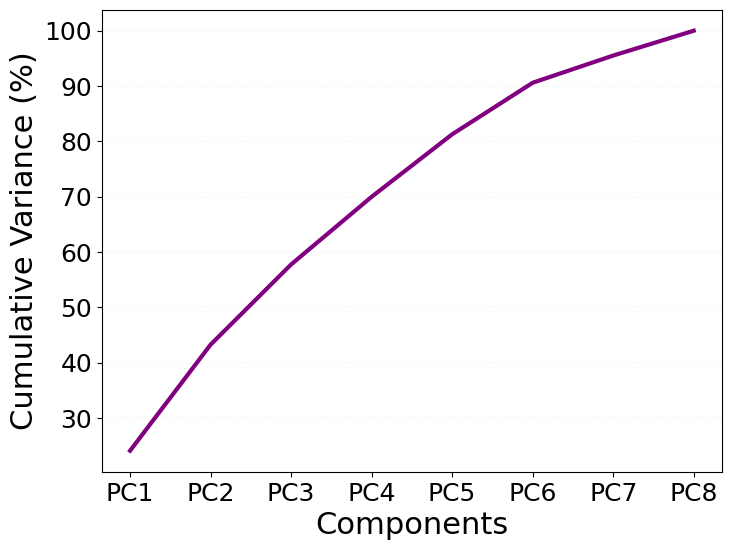

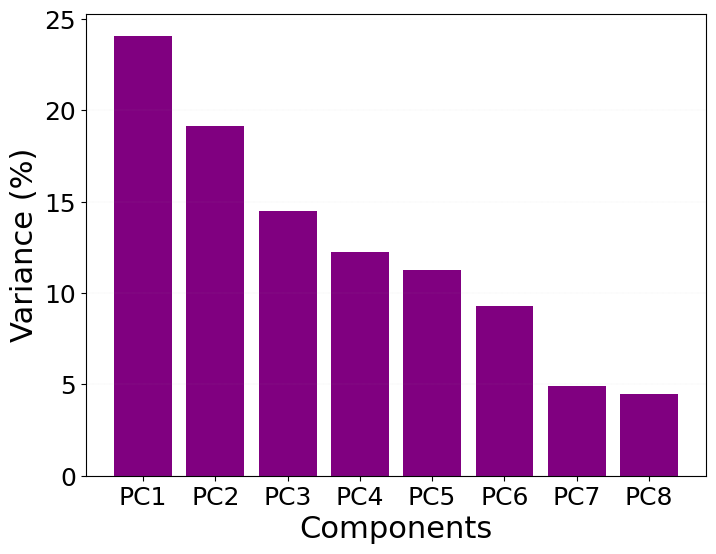

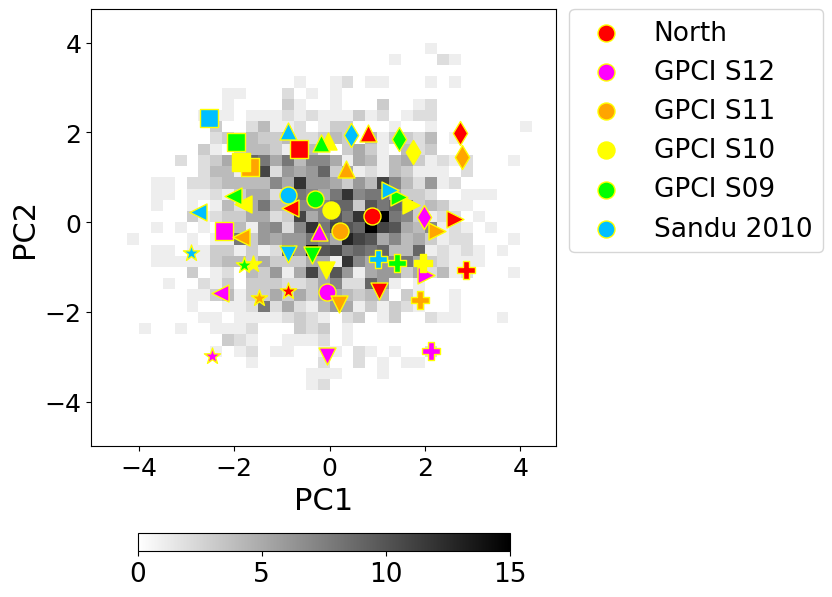

In [9]:
region3 = region2[CERES_iwp_occur_nonan < 3]

df      = df     [df     ['CERES IWP Occurence'] < 3]
df_mean = df_mean[df_mean['CERES IWP Occurence'] < 3]

df.reset_index(drop=True, inplace=True)
df_mean.reset_index(drop=True, inplace=True)

# df     [df     ['CERES IWP Occurence'] >= 3] = np.nan
# df_mean[df_mean['CERES IWP Occurence'] >= 3] = np.nan


print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']].isna().sum())
print(df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], \
          df_mean['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean['$q$ ($g$ $kg^{-1}$)'], df_mean['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean['EIS ($K$)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[8,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[8,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
#colors  = ['crimson', 'orangered', 'lime', 'deepskyblue', 'hotpink', 'darkgoldenrod', 'darkviolet']
markers = ['*', '<', 's', 'v', 'o', '^', 'P', '>', 'd']
dots    = [[], [], [], [], [], []]

PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values


xedges = np.arange(-5,5,.25)
yedges = np.arange(-5,5,.25)
H, xedges, yedges = np.histogram2d(PC1, PC2, bins=(xedges, yedges))
H = H.T
#H[H < 4] = np.nan

vmin,vmax = 0, 15
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
ticks=np.arange(0, 20, 5)

###
fig, axis = plt.subplots(1, 1, figsize=(6,8))#,
#plt.scatter(PC1, PC2, c='darkblue')
csf = plt.pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r') #gnuplot2 #viridis #**kwargs

for ii in range(len(traj_labels)):
    
    i_reg = np.where(region3 == ii)
    PC1 = df_reconst['PC1'].values[i_reg]
    PC2 = df_reconst['PC2'].values[i_reg]
    PC3 = df_reconst['PC3'].values[i_reg]    
    
#     l1 = (ii + 0) * df.index[-1] // len(traj_labels)
#     l2 = (ii + 1) * df.index[-1] // len(traj_labels)    
#     ll1 = np.where( abs(df.index - l1) == np.nanmin(abs(df.index - l1)) ) [0][0]
#     ll2 = np.where( abs(df.index - l2) == np.nanmin(abs(df.index - l2)) ) [0][0] - 1   
#     PC1 = df_reconst['PC1'].values[ll1:ll2]
#     PC2 = df_reconst['PC2'].values[ll1:ll2]
#     PC3 = df_reconst['PC3'].values[ll1:ll2]

    mean_norm1 = np.nanmean(PC1)
    std_norm1  = np.nanstd(PC1)
    mean_norm2 = np.nanmean(PC2)
    std_norm2  = np.nanstd(PC2)

    vals1 = [mean_norm1 + std_norm1 * 1.5 * (-1), mean_norm1 + std_norm1 * 1.5 * (0), mean_norm1 + std_norm1 * 1.5 * (1)]
    vals2 = [mean_norm2 + std_norm2 * 1.5 * (-1), mean_norm2 + std_norm2 * 1.5 * (0), mean_norm2 + std_norm2 * 1.5 * (1)]

    for i in range(3):
        for j in range(3):
            idx = np.where( (PC1 - vals1[i]) ** 2 + (PC2 - vals2[j]) ** 2 ==\
                   np.nanmin( (PC1 - vals1[i]) ** 2 + (PC2 - vals2[j]) ** 2 ) )[0][0]

            dots[ii].append(idx)

    dots[ii] = np.array(dots[ii])


    ############
    for jjj in range(len(dots[ii])):
        if jjj == 4:
            plt.scatter(PC1[dots[ii]][jjj], PC2[dots[ii]][jjj], marker=markers[jjj], c=colors[ii], s=150, edgecolor='yellow', label=traj_labels[ii])
        else:
            plt.scatter(PC1[dots[ii]][jjj], PC2[dots[ii]][jjj], marker=markers[jjj], c=colors[ii], s=150, edgecolor='yellow')
            
cb = plt.colorbar(csf, shrink=.8, pad=0.14, ticks=ticks, orientation='horizontal')#, ticks=ticks)
cb.ax.tick_params(labelsize=19)
#cb.ax.set_ylabel('Frequency', rotation=0, fontsize = 22, labelpad=15)
#axis.grid(linestyle=':', linewidth=.25, color='k')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
axis.tick_params(axis='both', which='major', labelsize=18)
plt.legend(bbox_to_anchor=(1., 1.03), loc="upper left", fontsize = '19')
plt.savefig('PC1_PC2.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

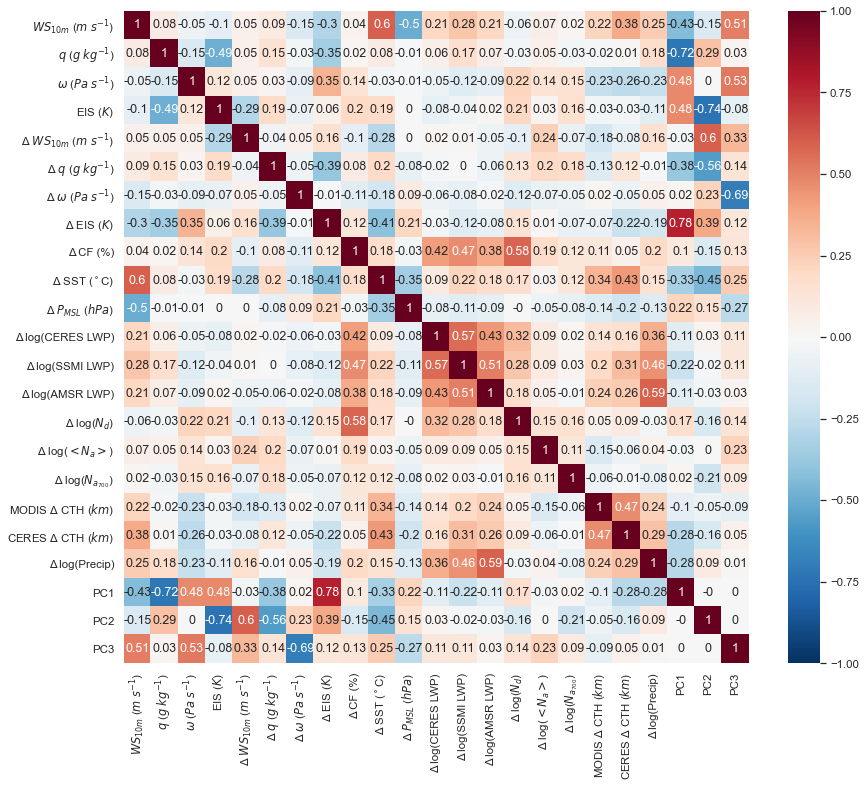

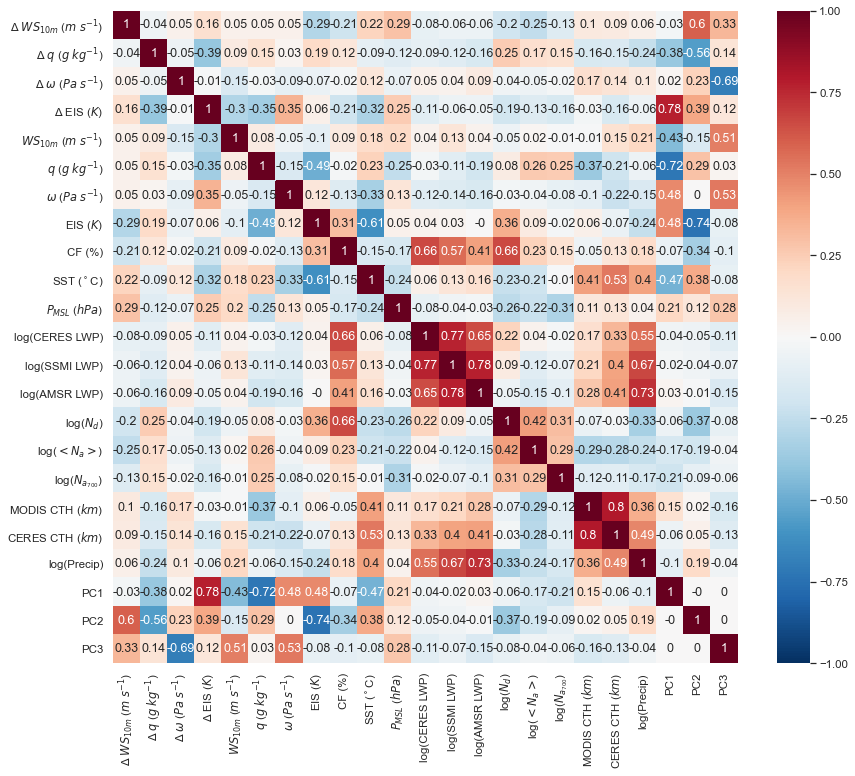

In [19]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']], \
                      df_mean, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

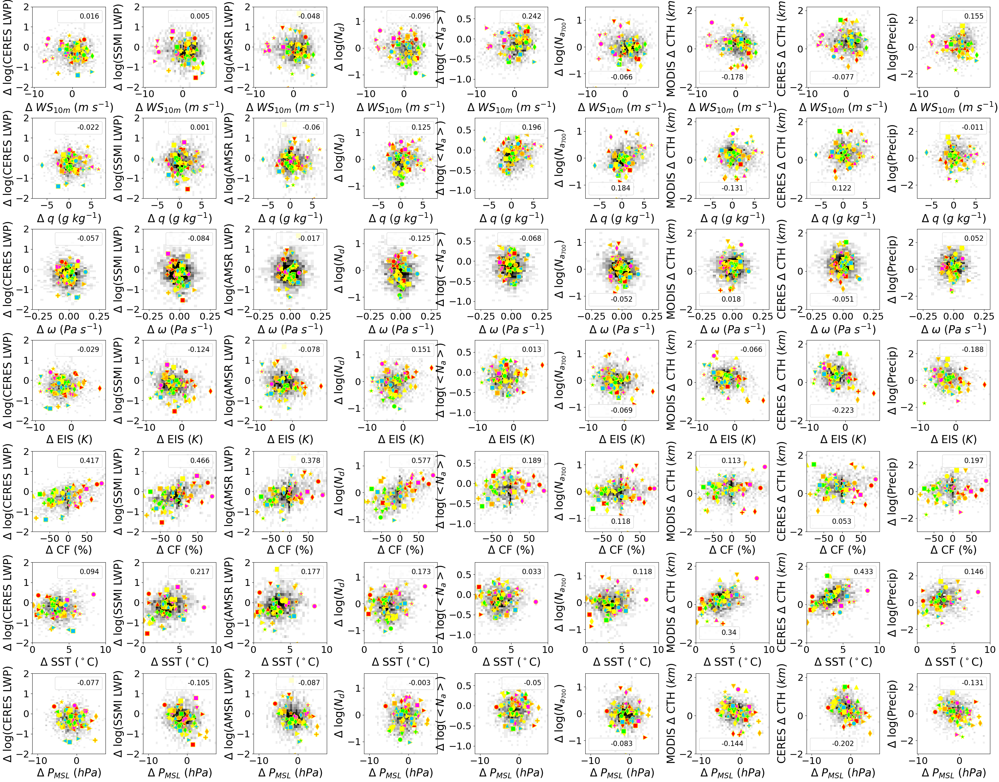

In [29]:
midl = df.shape[1] // 2
rows = df.columns[0:7]
cols = df.columns[7:16]

fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df[rows[i]].values
        var2 = df[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
#         model = LinearRegression()
#         model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
#         r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5
#         r_val = np.corrcoef(var1.reshape(-1, 1), var2.reshape(-1, 1))[0,1]
        r_val = np.corrcoef(var1, var2)[0,1]
        
        v1max_new = var1.max() + (var1.max() - var1.min()) / 40
        v2max_new = var2.max() + (var2.max() - var2.min()) / 40
        xedges = np.arange(var1.min(),v1max_new, (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),v2max_new, (var2.max() - var2.min()) / 40) 
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r') #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)
        ###
        if rows[i] == 'Δ $ω$ ($Pa$ $s^{-1}$)':
            axis[i,j].set_xlim([-.3, .3])
        if rows[i] == 'Δ SST ($^\circ$C)':
            axis[i,j].set_xlim([0, 10])            
        if rows[i] == '$Δ P_{MSL}$ ($hPa$)':
            axis[i,j].set_xlim([-10, 8])            
        if cols[j] == 'Δ log(Precip)':
            axis[i,j].set_ylim([-3, 3])  
        if cols[j] == 'Δ log($<N_a>$)':
            axis[i,j].set_ylim([-1.2, .8])   
        if cols[j] in ['Δ log(CERES LWP)', 'Δ log(AMSR LWP)', 'Δ log(SSMI LWP)']:
            axis[i,j].set_ylim([-2, 2])
        if cols[j] in ['MODIS Δ CTH ($km$)', 'CERES Δ CTH ($km$)']:
            axis[i,j].set_ylim([-2, 2.2])
        if cols[j] in ['Δ log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([-1.5, 1.5])              
    
        ###
        var1 = df[rows[i]].values
        var2 = df[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df.index - l1) == np.nanmin(abs(df.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df.index - l2) == np.nanmin(abs(df.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=100, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '25')
        axis[i,j].set_ylabel(cols[j], fontsize = '25')
        axis[i,j].tick_params(axis='both', which='major', labelsize=22)
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

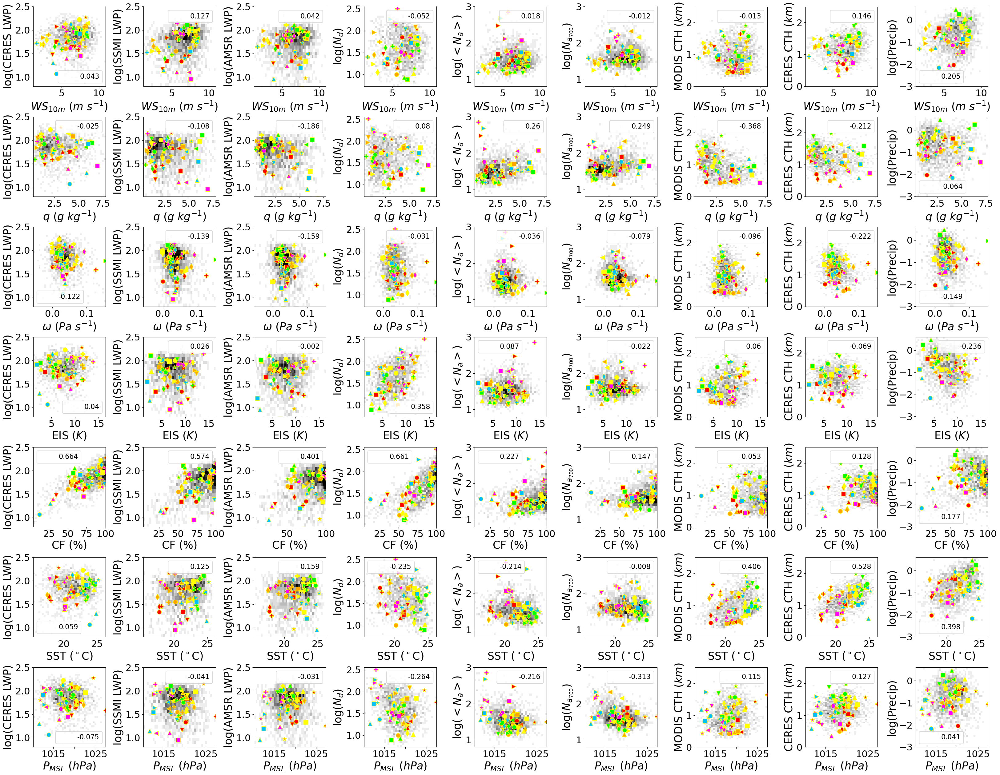

In [30]:
midl = df_mean.shape[1] // 2
rows = df_mean.columns[0:7]
cols = df_mean.columns[7:16]

fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_mean[rows[i]].values
        var2 = df_mean[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
#         model = LinearRegression()
#         model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
#         r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5
#         r_val = np.corrcoef(var1.reshape(-1, 1), var2.reshape(-1, 1))[0,1]
        r_val = np.corrcoef(var1, var2)[0,1]
        
        v1max_new = var1.max() + (var1.max() - var1.min()) / 40
        v2max_new = var2.max() + (var2.max() - var2.min()) / 40
        xedges = np.arange(var1.min(),v1max_new, (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),v2max_new, (var2.max() - var2.min()) / 40) 
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r', label=str(np.round(r_val,3))) #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)

        ###
        if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
            axis[i,j].set_ylim([.8, 2.5])
        if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
            axis[i,j].set_ylim([0, 2.5])
        if cols[j] in ['log($<N_a>$)', 'log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([.8, 3])              
        if rows[i] in ['$P_{MSL}$ ($hPa$)']:
            axis[i,j].axes.get_xaxis().set_ticklabels([" ", 1015, " ", 1025, " "])
            
        ###
        var1 = df_mean[rows[i]].values
        var2 = df_mean[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df_mean.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df_mean.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df_mean.index - l1) == np.nanmin(abs(df_mean.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df_mean.index - l2) == np.nanmin(abs(df_mean.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=100, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '25')
        axis[i,j].set_ylabel(cols[j], fontsize = '25')
        axis[i,j].tick_params(axis='both', which='major', labelsize=22)

            
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## 2024 paper

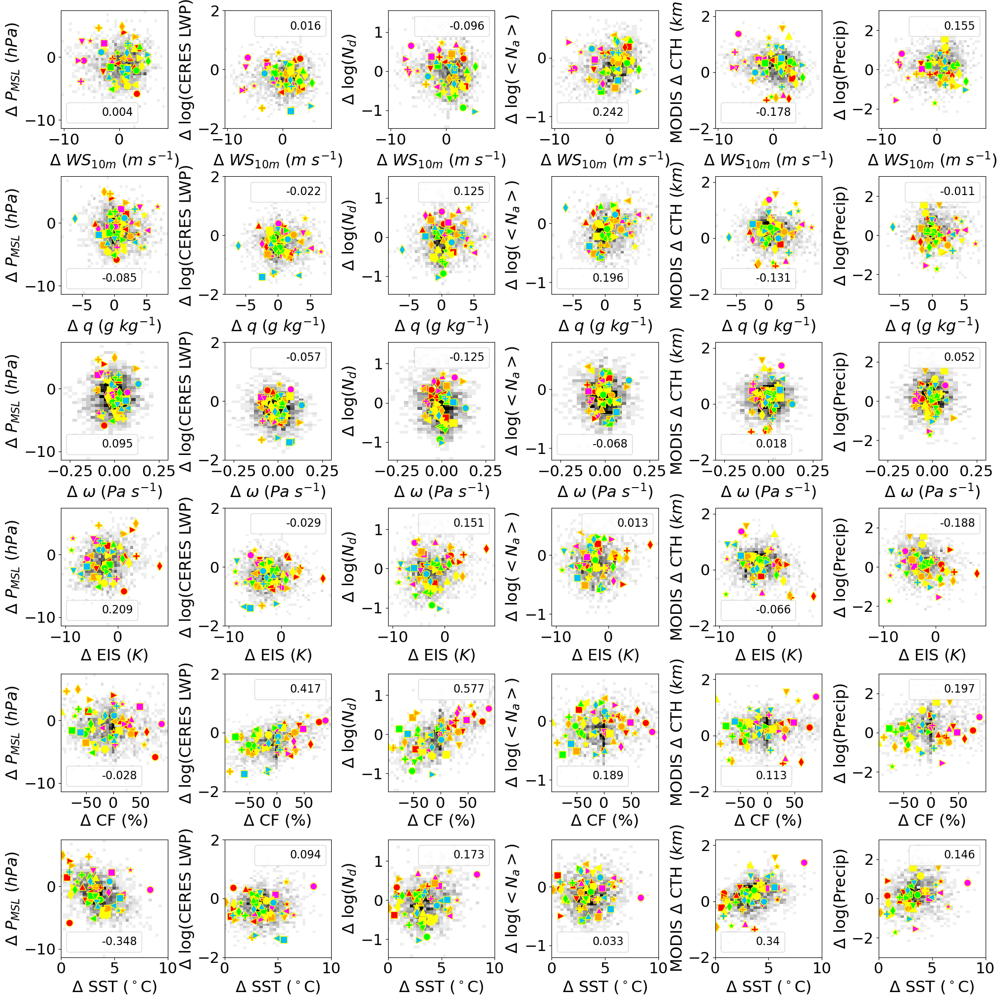

In [31]:
df_new = df.copy()
df_new.drop(['Δ log(SSMI LWP)', 'Δ log(AMSR LWP)', 'Δ log($N_{a_{700}}$)', 'CERES Δ CTH ($km$)'], inplace = True, axis=1)


midl = df_new.shape[1] // 2
rows = df_new.columns[0:6]
cols = df_new.columns[6:12]

fig, axis = plt.subplots(6, 6, figsize=(20,20))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_new[rows[i]].values
        var2 = df_new[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
#         model = LinearRegression()
#         model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
#         r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5
        r_val = np.corrcoef(var1, var2)[0,1]
        
        v1max_new = var1.max() + (var1.max() - var1.min()) / 40
        v2max_new = var2.max() + (var2.max() - var2.min()) / 40
        xedges = np.arange(var1.min(),v1max_new, (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),v2max_new, (var2.max() - var2.min()) / 40)        
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r') #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)
        ###
        if rows[i] == 'Δ $ω$ ($Pa$ $s^{-1}$)':
            axis[i,j].set_xlim([-.3, .3])
        if rows[i] == 'Δ SST ($^\circ$C)':
            axis[i,j].set_xlim([0, 10])            
        if rows[i] == '$Δ P_{MSL}$ ($hPa$)':
            axis[i,j].set_xlim([-10, 8])            
        if cols[j] == 'Δ log(Precip)':
            axis[i,j].set_ylim([-3, 3])  
        if cols[j] == 'Δ log($<N_a>$)':
            axis[i,j].set_ylim([-1.2, .8])   
        if cols[j] in ['Δ log(CERES LWP)', 'Δ log(AMSR LWP)', 'Δ log(SSMI LWP)']:
            axis[i,j].set_ylim([-2, 2])
        if cols[j] in ['MODIS Δ CTH ($km$)', 'CERES Δ CTH ($km$)']:
            axis[i,j].set_ylim([-2, 2.2])
        if cols[j] in ['Δ log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([-1.5, 1.5])              
    
        ###
        var1 = df_new[rows[i]].values
        var2 = df_new[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df_new.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df_new.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df_new.index - l1) == np.nanmin(abs(df_new.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df_new.index - l2) == np.nanmin(abs(df_new.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=100, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '23')
        axis[i,j].set_ylabel(cols[j], fontsize = '23')
        axis[i,j].tick_params(axis='both', which='major', labelsize=22)
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf_new', bbox_inches='tight', format='pdf_new', dpi=500)
plt.show()

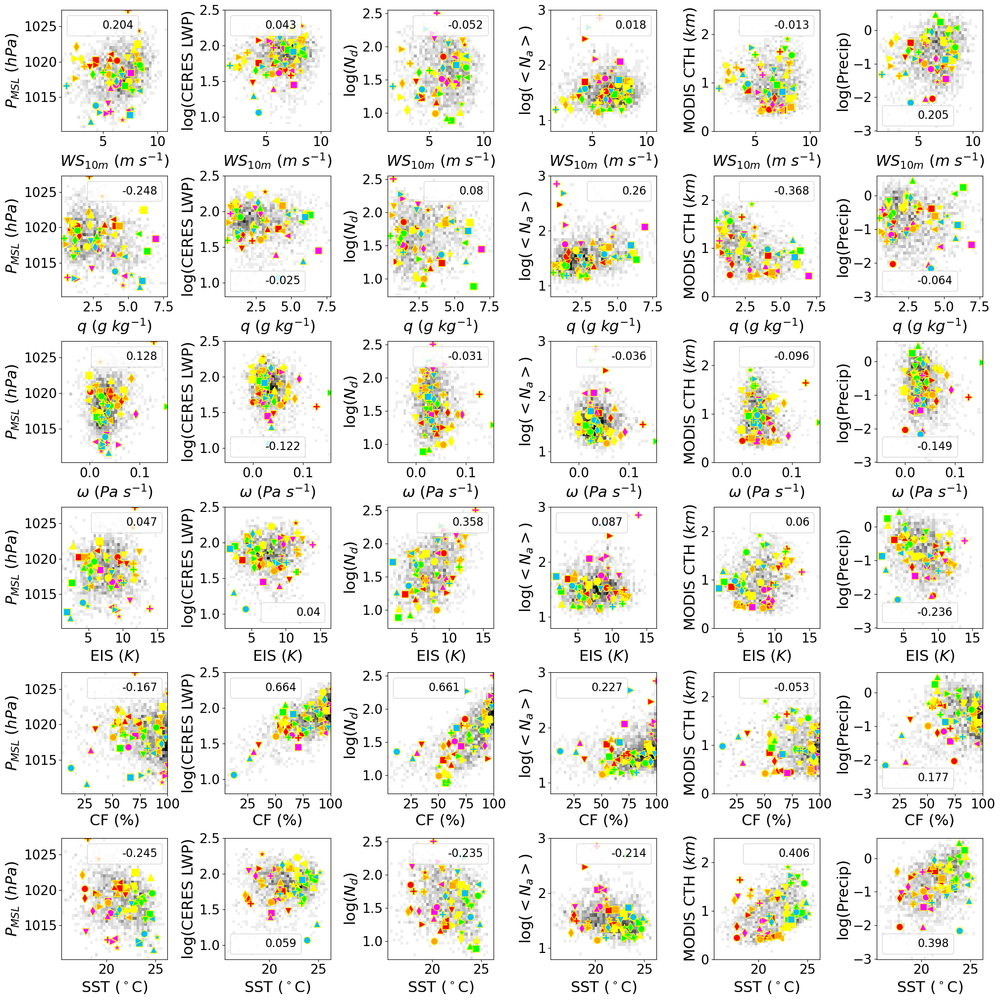

In [27]:
df_mean_new = df_mean.copy()
df_mean_new.drop(['log(SSMI LWP)', 'log(AMSR LWP)', 'log($N_{a_{700}}$)', 'CERES CTH ($km$)'], inplace = True, axis=1)

midl = df_mean_new.shape[1] // 2
rows = df_mean_new.columns[0:6]
cols = df_mean_new.columns[6:12]

fig, axis = plt.subplots(6, 6, figsize=(20,20))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_mean_new[rows[i]].values
        var2 = df_mean_new[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
#         model = LinearRegression()
#         model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
#         r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5
        r_val = np.corrcoef(var1, var2)[0,1]
        
        v1max_new = var1.max() + (var1.max() - var1.min()) / 40
        v2max_new = var2.max() + (var2.max() - var2.min()) / 40
        xedges = np.arange(var1.min(),v1max_new, (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),v2max_new, (var2.max() - var2.min()) / 40)        
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r', label=str(np.round(r_val,3))) #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)

        ###
        if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
            axis[i,j].set_ylim([.8, 2.5])
        if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
            axis[i,j].set_ylim([0, 2.5])
        if cols[j] in ['log($<N_a>$)', 'log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([.8, 3])              
        if rows[i] in ['$P_{MSL}$ ($hPa$)']:
            axis[i,j].axes.get_xaxis().set_ticklabels([" ", 1015, " ", 1025, " "])
            
        ###
        var1 = df_mean_new[rows[i]].values
        var2 = df_mean_new[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df_mean_new.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df_mean_new.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df_mean_new.index - l1) == np.nanmin(abs(df_mean_new.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df_mean_new.index - l2) == np.nanmin(abs(df_mean_new.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=100, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '22')
        axis[i,j].set_ylabel(cols[j], fontsize = '22')
        axis[i,j].tick_params(axis='both', which='major', labelsize=19)

            
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

In [20]:
df_mean

,$WS_{10m}$ ($m$ $s^{-1}$),$q$ ($g$ $kg^{-1}$),$ω$ ($Pa$ $s^{-1}$),EIS ($K$),CF (%),SST ($^\circ$C),$P_{MSL}$ ($hPa$),log(CERES LWP),log(SSMI LWP),log(AMSR LWP),log($N_d$),log($<N_a>$),log($N_{a_{700}}$),MODIS CTH ($km$),CERES CTH ($km$),log(Precip),CERES IWP Occurence
0,5.257955,2.393784,0.041941,10.400073,98.911919,16.649967,1024.557455,2.286835,1.992098,2.074293,1.716092,1.508683,1.561969,0.748862,1.203209,-0.570291,0.0
1,8.087721,2.164142,0.112062,11.384283,94.903368,18.502990,1019.021213,1.839890,1.315169,1.394156,1.654195,1.468025,2.003770,0.801507,1.058184,-1.286758,0.0
2,6.398090,1.182546,0.037804,12.159586,72.129234,19.894061,1022.947562,1.996316,1.784897,1.823717,1.219026,1.342228,1.731137,1.664112,1.589300,-0.380872,0.0
3,7.663510,1.921001,0.011274,9.850140,67.031787,21.370979,1022.272553,2.043476,2.036672,2.193634,1.128720,1.314593,1.645059,1.891274,1.900450,0.598424,0.0
4,7.945496,2.954867,0.016759,7.727904,50.763206,22.965707,1019.816332,1.872633,1.854170,1.827500,1.134627,1.381439,1.547276,1.910488,1.976604,-0.326631,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1658,5.663838,2.102601,0.025366,11.092774,86.803063,20.518594,1012.819689,1.900614,1.618249,1.847524,1.871305,1.621343,1.485171,0.814715,1.238886,-0.806836,0.0
1659,7.713518,1.353913,0.017327,9.979743,96.400472,21.684885,1015.365872,1.805489,1.702964,1.733457,1.900579,1.524321,1.824120,1.012486,1.471926,-1.101195,0.0
1660,7.424703,1.591572,0.049138,8.035818,92.152119,22.649573,1015.914087,1.948098,1.972893,1.973383,1.545351,1.555539,1.718104,1.409016,1.550989,-0.167689,0.0
1661,6.725569,1.998512,0.037287,6.836208,77.685979,23.855722,1015.671150,1.823212,1.717260,1.864053,1.271225,1.193780,1.446387,1.350472,1.444251,-0.076959,0.0


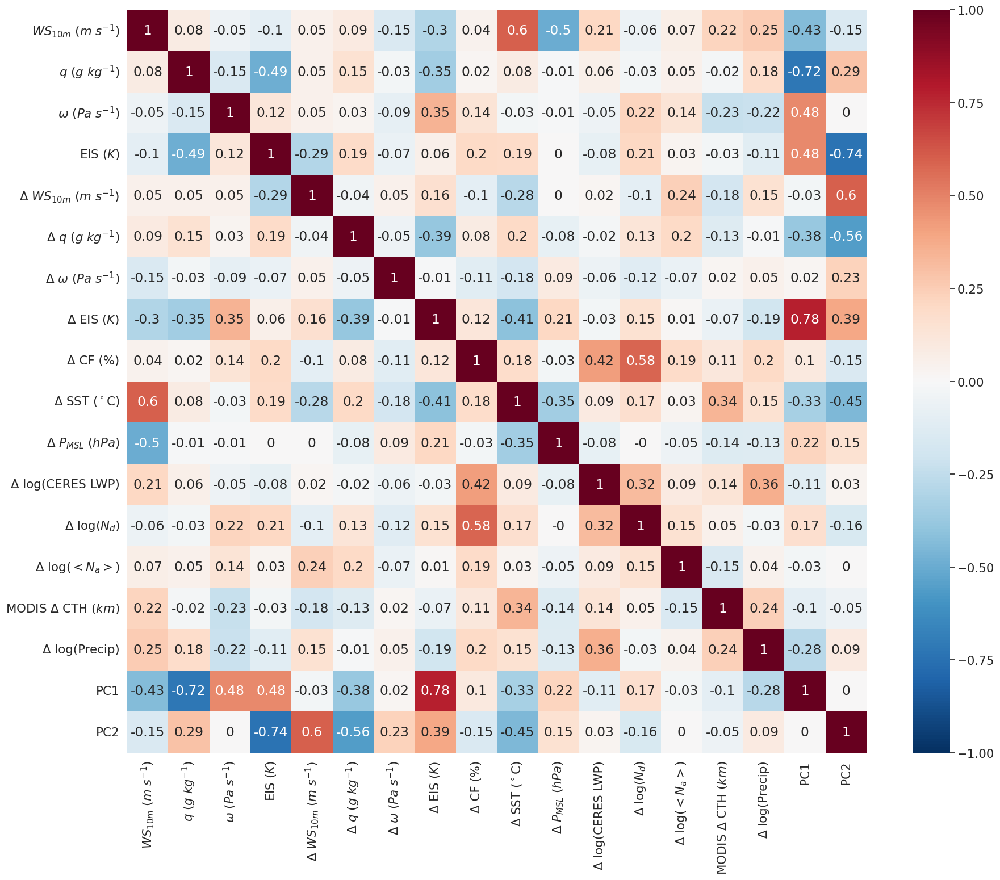

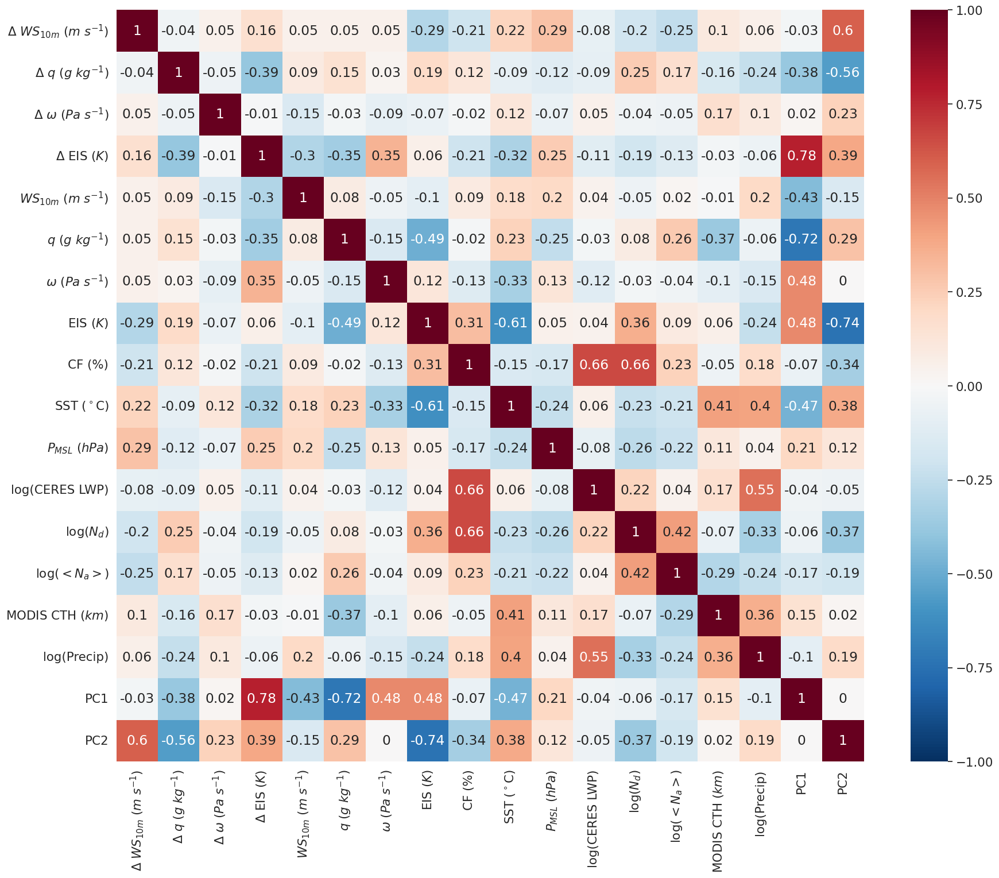

In [50]:
# Concatenate all variables and PCs
df_mean_new = df_mean.copy()
df_mean_new.drop(['log(SSMI LWP)', 'log(AMSR LWP)', 'log($N_{a_{700}}$)', 'CERES CTH ($km$)'], inplace = True, axis=1)

df_new = df.copy()
df_new.drop(['Δ log(SSMI LWP)', 'Δ log(AMSR LWP)', 'Δ log($N_{a_{700}}$)', 'CERES Δ CTH ($km$)'], inplace = True, axis=1)

df_all = pd.concat([df_mean_new[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']], \
                      df_new, df_reconst['PC1'], df_reconst['PC2']], axis=1) # , df_reconst['PC3']
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(21,17))
sb.set(font_scale=1.4)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.savefig('corr_heat_map_delta.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

###
df_all = pd.concat([df_new[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']], \
                      df_mean_new, df_reconst['PC1'], df_reconst['PC2']], axis=1) # , df_reconst['PC3']
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(21,17))
sb.set(font_scale=1.4)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.savefig('corr_heat_map.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

In [29]:
df_mean.columns

Index(['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)',
       '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)', 'SST ($^\circ$C)',
       '$P_{MSL}$ ($hPa$)', 'log(CERES LWP)', 'log(SSMI LWP)', 'log(AMSR LWP)',
       'log($N_d$)', 'log($<N_a>$)', 'log($N_{a_{700}}$)', 'MODIS CTH ($km$)',
       'CERES CTH ($km$)', 'log(Precip)', 'CERES IWP Occurence'],
      dtype='object')

In [ ]:
'log(SSMI LWP)', 'log(AMSR LWP)', 'log($N_{a_{700}}$)', 'CERES CTH ($km$)'

In [11]:
vals1_1 = [-1.5, 0, 1.5]
vals2_2 = [-1.5, 0, 1.5]
space   = []

for i in range(3):
    for j in range(3):
        space.append((vals1_1[i], vals2_2[j]))

space = np.array(space)
space

array([[-1.5, -1.5],
       [-1.5,  0. ],
       [-1.5,  1.5],
       [ 0. , -1.5],
       [ 0. ,  0. ],
       [ 0. ,  1.5],
       [ 1.5, -1.5],
       [ 1.5,  0. ],
       [ 1.5,  1.5]])

In [12]:
for ii in range(len(traj_labels)):
    i_reg = np.where(region3 == ii)
    DATES3_s = DATES3[i_reg]
    for jjj in range(len(dots[ii])):
        print(DATES3_s[dots[ii]][jjj])

20180627_r00
20210807_r00
20190803_r00
20200822_r00
20210601_r00
20210808_r00
20200607_r00
20180815_r00
20190801_r00
20210828_r01
20180808_r01
20190725_r01
20210629_r01
20190605_r01
20190829_r01
20210819_r01
20200830_r01
20200614_r01
20180623_r02
20200821_r02
20190729_r02
20180621_r02
20210807_r02
20210815_r02
20180617_r02
20200729_r02
20210608_r02
20210828_r03
20180731_r03
20200804_r03
20180622_r03
20180804_r03
20190814_r03
20190624_r03
20180822_r03
20190808_r03
20180601_r04
20210806_r04
20180813_r04
20180702_r04
20190715_r04
20190720_r04
20200730_r04
20200627_r04
20210816_r04
20190821_r05
20190803_r05
20180704_r05
20200609_r05
20180708_r05
20200819_r05
20190619_r05
20210823_r05
20210704_r05


## Sorting cases into eight categories:
- Categories based on high/low initial boundary layer depth (<> 1000m), cloud fraction (<>70%) and aerosol (<> 70/cm3) might be a start.
- Try a few shallow boundary layer cases with high initial cloud cover and a range of initial aerosol concentrations.

### Variable at the start of trajectories

In [3]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

# def create_deseasonalized(var):
#     var_deseas = var.copy()
#     var_deseas[:] = np.nan
#     var_m = np.nanmean(var,2)
#     for i in range(var.shape[2]):
#         var_deseas[:,:,i,:] = var[:,:,i,:] - var_m
#     return var_deseas

def process_start(var):
#     var = create_deseasonalized(var)
    var_delta = var[0,:,:,:].copy()
    for i in range(var.shape[1]):
        for j in range(var.shape[2]):
            for k in range(var.shape[3]):
                temp = var[:,i,j,k].copy()
                var_nonan = temp[np.isnan(temp) == 0]
                if len(var_nonan) > 30:
                    var_delta[i,j,k] = np.nanmean(var_nonan[:4])
                else:
                    try:
                        var_delta[i,j,k] = var_nonan[0]            
                    except:
                        var_delta[i,j,k] = np.nan
    var_delta = var_delta.reshape(-1)
    var_delta = var_delta[i_nonan]                
    return var_delta

###
# AMSR_prec_des = create_deseasonalized(AMSR_prec)
AMSR_prec_des = AMSR_prec.copy()
var = np.log10(AMSR_prec)
var_delta = var[0,:,:,:].copy()
for i in range(var.shape[1]):
    for j in range(var.shape[2]):
        for k in range(var.shape[3]):
            var_delta[i,j,k] = np.nanmean(var[:,i,j,k][:24])
var_delta = var_delta.reshape(-1)
var_delta = var_delta[i_nonan] 

AMSR_prec_delta = var_delta.copy()

###
era5_sst_anomn_dly_t_df  = pd.DataFrame(process_start(ERA_SST  ), columns=['SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process_start(ERA_WS10 ), columns=['$WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process_start(ERA_Pmsl ), columns=['$P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process_start(ERA_q_700), columns=['$q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process_start(ERA_w_700), columns=['$ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process_start(ERA_EIS  ), columns=['EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process_start(CERES_cld), columns=['CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_start(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_start(np.log10(CERES_lwp) ), columns=['log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(SSMI_lwp ) ), columns=['log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(AMSR_lwp ) ), columns=['log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process_start(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process_start(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(CERES_Nd) ), columns=['log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(MERRA_Na_m)),columns=['log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(MERRA_Na_700)),columns=['log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process_start(MODIS_CTH), columns=['MODIS CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process_start(CERES_CTH), columns=['CERES CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(AMSR_prec_delta, columns=['log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan   , columns=['CERES IWP Occurence'])

df_start = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df , era5_sst_anomn_dly_t_df , \
                era5_pmsl_anomn_dly_t_df, ceres_lwp_anomn_dly_t_df, ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

df_start = df_start[df_start['CERES IWP Occurence'] < 3]
region3 = region2[CERES_iwp_occur_nonan < 3]


NameError: name 'ERA_SST' is not defined

In [51]:
df_start.describe()

,$WS_{10m}$ ($m$ $s^{-1}$),$q$ ($g$ $kg^{-1}$),$ω$ ($Pa$ $s^{-1}$),EIS ($K$),CF (%),SST ($^\circ$C),$P_{MSL}$ ($hPa$),log(CERES LWP),log(SSMI LWP),log(AMSR LWP),log($N_d$),log($<N_a>$),log($N_{a_{700}}$),MODIS CTH ($km$),CERES CTH ($km$),log(Precip),CERES IWP Occurence
count,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1653.000000,1634.000000,1568.000000,1663.000000,1663.000000,1646.000000,1663.000000,1532.000000,1663.000000
mean,6.495973,2.588121,0.034146,8.634884,78.301628,19.763110,1019.056184,2.093204,-inf,-inf,1.591671,1.617065,1.629353,0.892299,1.141918,-inf,0.233915
std,2.347341,1.727764,0.057169,2.901515,28.354146,2.253406,3.122562,0.421826,NaN,NaN,0.368053,0.299189,0.307505,0.475516,0.410369,NaN,0.578395
min,0.643399,0.101061,-0.326821,0.145295,0.084338,13.184647,1009.954970,0.669791,-inf,-inf,0.397408,0.675172,0.443536,0.139471,0.153867,-inf,0.000000
25%,4.876125,1.275994,-0.003013,6.730403,64.544996,17.968135,1016.888200,1.849307,1.631571,1.516555,1.322623,1.426404,1.451298,0.508217,0.858203,-1.364076,0.000000
50%,6.519367,2.085655,0.029933,8.740226,93.307499,20.017383,1019.117881,2.108606,1.934972,1.833307,1.613438,1.585910,1.580555,0.818140,1.140707,-0.795265,0.000000
75%,8.076257,3.535363,0.064523,10.688686,99.690359,21.656328,1021.141919,2.367511,2.095823,2.053653,1.886283,1.760487,1.758474,1.220539,1.415333,-0.310845,0.000000
max,13.382098,9.648779,0.362525,16.270348,100.000000,24.904792,1028.760127,3.291453,2.503663,2.822618,2.542840,3.541390,3.218416,2.495036,2.722053,0.906182,2.000000


### Variable at the end of trajectories

In [87]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

# def create_deseasonalized(var):
#     var_deseas = var.copy()
#     var_deseas[:] = np.nan
#     var_m = np.nanmean(var,2)
#     for i in range(var.shape[2]):
#         var_deseas[:,:,i,:] = var[:,:,i,:] - var_m
#     return var_deseas

def process_end(var):
#     var = create_deseasonalized(var)
    var_delta = var[0,:,:,:].copy()
    for i in range(var.shape[1]):
        for j in range(var.shape[2]):
            for k in range(var.shape[3]):
                temp = var[:,i,j,k].copy()
                var_nonan = temp[np.isnan(temp) == 0]
                if len(var_nonan) > 30:
                    var_delta[i,j,k] = np.nanmean(var_nonan[-4:])
                else:
                    try:
                        var_delta[i,j,k] = var_nonan[0]            
                    except:
                        var_delta[i,j,k] = np.nan
    var_delta = var_delta.reshape(-1)
    var_delta = var_delta[i_nonan]                
    return var_delta

###
# AMSR_prec_des = create_deseasonalized(AMSR_prec)
AMSR_prec_des = AMSR_prec.copy()
var = np.log10(AMSR_prec)
var_delta = var[0,:,:,:].copy()
for i in range(var.shape[1]):
    for j in range(var.shape[2]):
        for k in range(var.shape[3]):
            var_delta[i,j,k] = np.nanmean(var[:,i,j,k][24:])
var_delta = var_delta.reshape(-1)
var_delta = var_delta[i_nonan] 

AMSR_prec_delta = var_delta.copy()

###
era5_sst_anomn_dly_t_df  = pd.DataFrame(process_end(ERA_SST  ), columns=['SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process_end(ERA_WS10 ), columns=['$WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process_end(ERA_Pmsl ), columns=['$P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process_end(ERA_q_700), columns=['$q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process_end(ERA_w_700), columns=['$ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process_end(ERA_EIS  ), columns=['EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process_end(CERES_cld), columns=['CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_end(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_end(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_end(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_end(np.log10(CERES_lwp) ), columns=['log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_end(np.log10(SSMI_lwp ) ), columns=['log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_end(np.log10(AMSR_lwp ) ), columns=['log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process_end(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process_end(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process_end(np.log10(CERES_Nd) ), columns=['log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process_end(np.log10(MERRA_Na_m)),columns=['log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process_end(np.log10(MERRA_Na_700)),columns=['log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process_end(MODIS_CTH), columns=['MODIS CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process_end(CERES_CTH), columns=['CERES CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(AMSR_prec_delta, columns=['log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan   , columns=['CERES IWP Occurence'])

df_end = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df , era5_sst_anomn_dly_t_df , \
                era5_pmsl_anomn_dly_t_df, ceres_lwp_anomn_dly_t_df, ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

df_end = df_end[df_end['CERES IWP Occurence'] < 3]
region3 = region2[CERES_iwp_occur_nonan < 3]


In [88]:
df_end.describe()

,$WS_{10m}$ ($m$ $s^{-1}$),$q$ ($g$ $kg^{-1}$),$ω$ ($Pa$ $s^{-1}$),EIS ($K$),CF (%),SST ($^\circ$C),$P_{MSL}$ ($hPa$),log(CERES LWP),log(SSMI LWP),log(AMSR LWP),log($N_d$),log($<N_a>$),log($N_{a_{700}}$),MODIS CTH ($km$),CERES CTH ($km$),log(Precip),CERES IWP Occurence
count,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1653.000000,1634.000000,1568.000000,1663.000000,1663.000000,1646.000000,1663.000000,1546.000000,1663.000000
mean,6.873253,3.066754,0.027394,6.368090,72.624833,23.248502,1017.812238,2.082197,-inf,-inf,1.592208,1.475039,1.631256,0.892299,1.490522,-0.653618,0.233915
std,2.069475,1.963640,0.049136,2.888495,27.398617,2.036439,2.852443,0.433854,NaN,NaN,0.368117,0.274979,0.292386,0.475516,0.442803,0.755396,0.578395
min,0.457529,0.204435,-0.617575,-0.757616,0.000000,15.258759,1009.470538,0.669791,-inf,-inf,0.397408,0.749873,0.038491,0.139471,0.178977,-3.879458,0.000000
25%,5.634432,1.357635,-0.002280,4.264745,54.585488,21.973059,1015.823355,1.839076,1.631571,1.516555,1.323443,1.289129,1.443819,0.508217,1.186877,-1.140023,0.000000
50%,7.143285,2.650724,0.025827,6.417606,81.797827,23.421276,1017.750163,2.106544,1.934972,1.833307,1.613645,1.440526,1.584677,0.818140,1.491084,-0.538296,0.000000
75%,8.375858,4.540289,0.054742,8.282791,96.635715,24.739864,1019.750193,2.360473,2.095823,2.053653,1.886283,1.620339,1.774545,1.220539,1.792646,-0.068898,0.000000
max,11.645719,10.155542,0.222246,17.435625,100.000000,27.839697,1027.975230,3.291453,2.503663,2.822618,2.542840,3.048765,2.928982,2.495036,3.028260,0.814630,2.000000


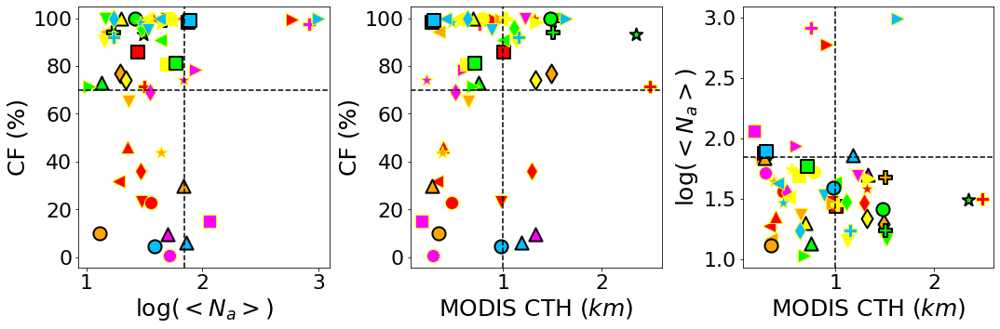

In [109]:
end_CF_thresh = 50
CF_thresh     = 70
Na_thresh     = 70

######
fig, axis = plt.subplots(1, 3, figsize=(15,5))

rows = ['log($<N_a>$)', 'MODIS Δ CTH ($km$)']
cols = ['CF (%)', ]

###
i = 0
var1 = df_start['log($<N_a>$)'].values
var2 = df_start['CF (%)'].values
CF_end = df_end['CF (%)'].values

for ii in range(len(traj_labels)):

    i_reg = np.where(region3 == ii)
    var1_s = var1[i_reg]
    var2_s = var2[i_reg]        
    CF_end_s = CF_end[i_reg]        

    for jjj in range(len(dots[ii])):
        if CF_end_s[dots[ii]][jjj] <= end_CF_thresh:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, linewidth=2, edgecolor='k')        
        else:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')

axis[i].axhline(y=CF_thresh, color='k', linestyle='--')
axis[i].axvline(x=np.log10(Na_thresh), color='k', linestyle='--')
axis[i].set_xlabel('log($<N_a>$)', fontsize = '25')
axis[i].set_ylabel('CF (%)', fontsize = '25')
axis[i].tick_params(axis='both', which='major', labelsize=22)

###
i = 1
var1 = df_start['MODIS CTH ($km$)'].values
var2 = df_start['CF (%)'].values
CF_end = df_end['CF (%)'].values

for ii in range(len(traj_labels)):

    i_reg = np.where(region3 == ii)
    var1_s = var1[i_reg]
    var2_s = var2[i_reg]        
    CF_end_s = CF_end[i_reg]        

    for jjj in range(len(dots[ii])):
        if CF_end_s[dots[ii]][jjj] <= end_CF_thresh:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, linewidth=2, edgecolor='k')        
        else:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')

axis[i].axhline(y=CF_thresh, color='k', linestyle='--')
axis[i].axvline(x=1, color='k', linestyle='--')
axis[i].set_xlabel('MODIS CTH ($km$)', fontsize = '25')
axis[i].set_ylabel('CF (%)', fontsize = '25')
axis[i].tick_params(axis='both', which='major', labelsize=22)

###
i = 2
var1 = df_start['MODIS CTH ($km$)'].values
var2 = df_start['log($<N_a>$)'].values
CF_end = df_end['CF (%)'].values

for ii in range(len(traj_labels)):

    i_reg = np.where(region3 == ii)
    var1_s = var1[i_reg]
    var2_s = var2[i_reg]        
    CF_end_s = CF_end[i_reg]        

    for jjj in range(len(dots[ii])):
        if CF_end_s[dots[ii]][jjj] <= end_CF_thresh:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, linewidth=2, edgecolor='k')        
        else:
            axis[i].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')

axis[i].axhline(y=np.log10(Na_thresh), color='k', linestyle='--')
axis[i].axvline(x=1, color='k', linestyle='--')
axis[i].set_xlabel('MODIS CTH ($km$)', fontsize = '25')
axis[i].set_ylabel('log($<N_a>$)', fontsize = '25')
axis[i].tick_params(axis='both', which='major', labelsize=22)

plt.tight_layout(pad=1)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()


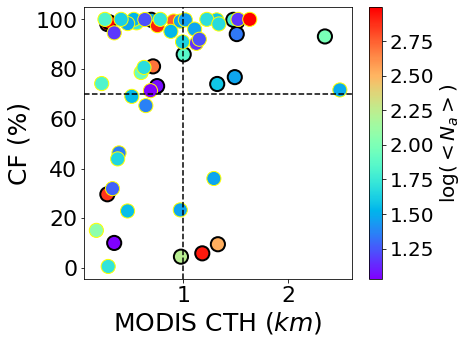

In [111]:
end_CF_thresh = 50

####
fig, axis = plt.subplots(1, 1, figsize=(6,5))

###
i = 0
var1 = df_start['MODIS CTH ($km$)'].values
var2 = df_start['CF (%)'].values
var3 = df_start['log($<N_a>$)'].values
CF_end = df_end['CF (%)'].values

v1 = []; v2 = []; v3 = []; mkr = []; CF_end_all = [] 
for ii in range(len(traj_labels)):

    i_reg = np.where(region3 == ii)
    var1_s = var1[i_reg]
    var2_s = var2[i_reg]        
    var3_s = var3[i_reg]        
    CF_end_s = CF_end[i_reg]        
    
    for jjj in range(len(dots[ii])):
#         axis.scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=var3_s[dots[ii]][jjj],s=200, edgecolor='yellow')
        v1.append(var1_s[dots[ii]][jjj])
        v2.append(var2_s[dots[ii]][jjj])
        v3.append(var3_s[dots[ii]][jjj])
        mkr.append(markers[jjj])
        CF_end_all.append(CF_end_s[dots[ii]][jjj])

v1 = np.array(v1); v2 = np.array(v2); v3 = np.array(v3); CF_end_all = np.array(CF_end_all); 
idx_CF = np.where(CF_end_all <= end_CF_thresh)
idx_CF_no = np.where(CF_end_all > end_CF_thresh)

s11 = plt.scatter(v1[idx_CF], v2[idx_CF], c=v3[idx_CF], s=200, linewidth=2, edgecolor='k', cmap='rainbow')
s11 = plt.scatter(v1[idx_CF_no], v2[idx_CF_no], c=v3[idx_CF_no], s=200, edgecolor='yellow', cmap='rainbow')

cb  = plt.colorbar(s11, ticks=np.arange(.75,3.5,.25))
cb.set_label('log($<N_a>$)', fontsize=20)
cb.ax.tick_params(labelsize=20) 

axis.axhline(y=CF_thresh, color='k', linestyle='--')
axis.axvline(x=1, color='k', linestyle='--')
axis.set_xlabel('MODIS CTH ($km$)', fontsize = '25')
axis.set_ylabel('CF (%)', fontsize = '25')
axis.tick_params(axis='both', which='major', labelsize=22)


# Additional tests

# Including CF in PCA
## PCA based on variable differences and mean variables
### Removing ice cases

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
Δ CF (%)                       0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
CF (%)                       0
dtype: int64


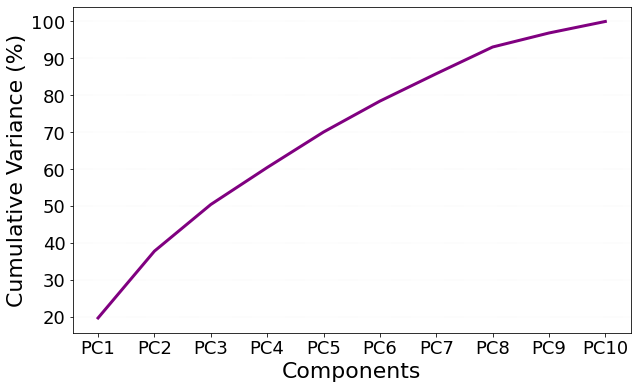

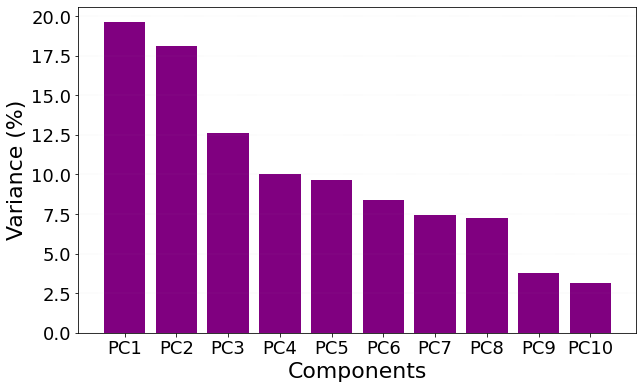

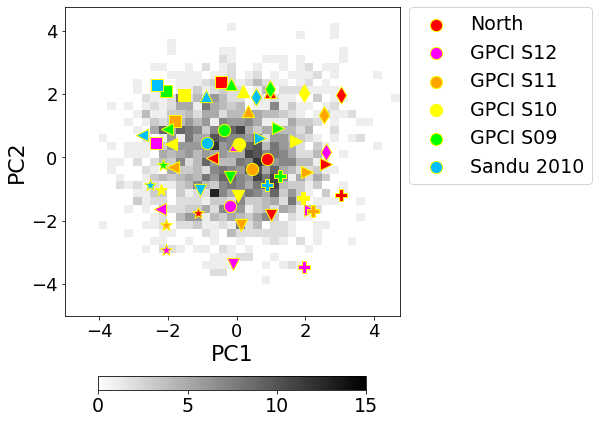

In [10]:
region3 = region2[CERES_iwp_occur_nonan < 3]

df      = df     [df     ['CERES IWP Occurence'] < 3]
df_mean = df_mean[df_mean['CERES IWP Occurence'] < 3]

df.reset_index(drop=True, inplace=True)
df_mean.reset_index(drop=True, inplace=True)

# df     [df     ['CERES IWP Occurence'] >= 3] = np.nan
# df_mean[df_mean['CERES IWP Occurence'] >= 3] = np.nan


print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)', 'Δ CF (%)']].isna().sum())
print(df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], df['Δ CF (%)'], \
          df_mean['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean['$q$ ($g$ $kg^{-1}$)'], df_mean['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean['EIS ($K$)'], df_mean['CF (%)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[10,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[10,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.png', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
#colors  = ['crimson', 'orangered', 'lime', 'deepskyblue', 'hotpink', 'darkgoldenrod', 'darkviolet']
markers = ['*', '<', 's', 'v', 'o', '^', 'P', '>', 'd']
dots    = [[], [], [], [], [], []]

PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values


xedges = np.arange(-5,5,.25)
yedges = np.arange(-5,5,.25)
H, xedges, yedges = np.histogram2d(PC1, PC2, bins=(xedges, yedges))
H = H.T
#H[H < 4] = np.nan

vmin,vmax = 0, 15
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
ticks=np.arange(0, 20, 5)

###
fig, axis = plt.subplots(1, 1, figsize=(6,8))#,
#plt.scatter(PC1, PC2, c='darkblue')
csf = plt.pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r') #gnuplot2 #viridis #**kwargs

for ii in range(len(traj_labels)):
    
    i_reg = np.where(region3 == ii)
    PC1 = df_reconst['PC1'].values[i_reg]
    PC2 = df_reconst['PC2'].values[i_reg]
    PC3 = df_reconst['PC3'].values[i_reg]    
    
#     l1 = (ii + 0) * df.index[-1] // len(traj_labels)
#     l2 = (ii + 1) * df.index[-1] // len(traj_labels)    
#     ll1 = np.where( abs(df.index - l1) == np.nanmin(abs(df.index - l1)) ) [0][0]
#     ll2 = np.where( abs(df.index - l2) == np.nanmin(abs(df.index - l2)) ) [0][0] - 1   
#     PC1 = df_reconst['PC1'].values[ll1:ll2]
#     PC2 = df_reconst['PC2'].values[ll1:ll2]
#     PC3 = df_reconst['PC3'].values[ll1:ll2]

    mean_norm1 = np.nanmean(PC1)
    std_norm1  = np.nanstd(PC1)
    mean_norm2 = np.nanmean(PC2)
    std_norm2  = np.nanstd(PC2)

    vals1 = [mean_norm1 + std_norm1 * 1.5 * (-1), mean_norm1 + std_norm1 * 1.5 * (0), mean_norm1 + std_norm1 * 1.5 * (1)]
    vals2 = [mean_norm2 + std_norm2 * 1.5 * (-1), mean_norm2 + std_norm2 * 1.5 * (0), mean_norm2 + std_norm2 * 1.5 * (1)]

    for i in range(3):
        for j in range(3):
            idx = np.where( (PC1 - vals1[i]) ** 2 + (PC2 - vals2[j]) ** 2 ==\
                   np.nanmin( (PC1 - vals1[i]) ** 2 + (PC2 - vals2[j]) ** 2 ) )[0][0]

            dots[ii].append(idx)

    dots[ii] = np.array(dots[ii])


    ############
    for jjj in range(len(dots[ii])):
        if jjj == 4:
            plt.scatter(PC1[dots[ii]][jjj], PC2[dots[ii]][jjj], marker=markers[jjj], c=colors[ii], s=150, edgecolor='yellow', label=traj_labels[ii])
        else:
            plt.scatter(PC1[dots[ii]][jjj], PC2[dots[ii]][jjj], marker=markers[jjj], c=colors[ii], s=150, edgecolor='yellow')
            
cb = plt.colorbar(csf, shrink=.8, pad=0.14, ticks=ticks, orientation='horizontal')#, ticks=ticks)
cb.ax.tick_params(labelsize=19)
#cb.ax.set_ylabel('Frequency', rotation=0, fontsize = 22, labelpad=15)
#axis.grid(linestyle=':', linewidth=.25, color='k')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
axis.tick_params(axis='both', which='major', labelsize=18)
plt.legend(bbox_to_anchor=(1., 1.03), loc="upper left", fontsize = '19')
plt.savefig('PC1_PC2.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

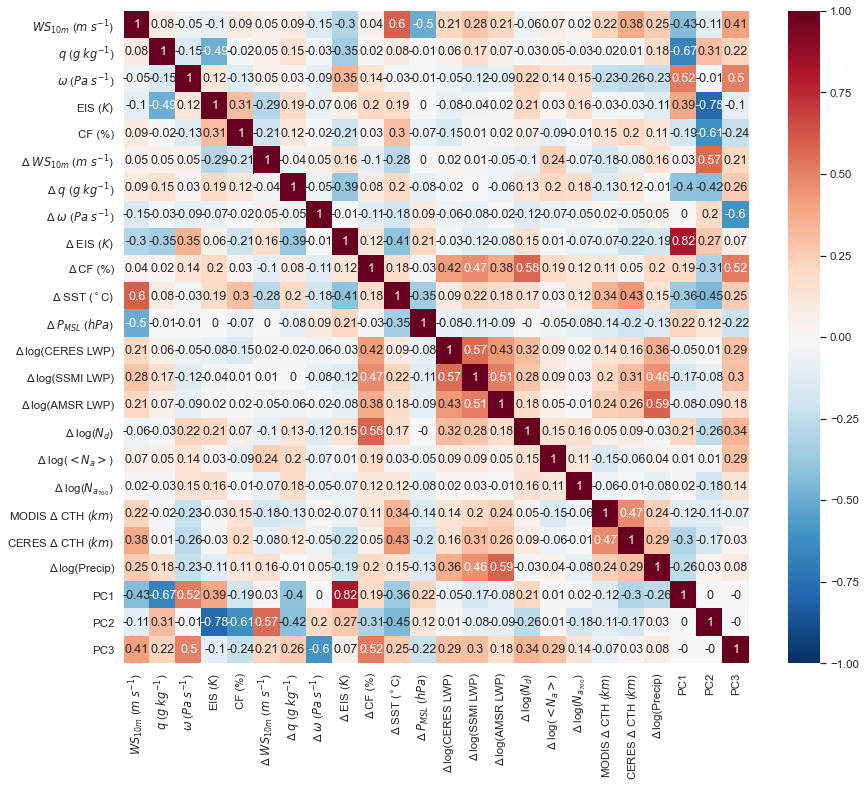

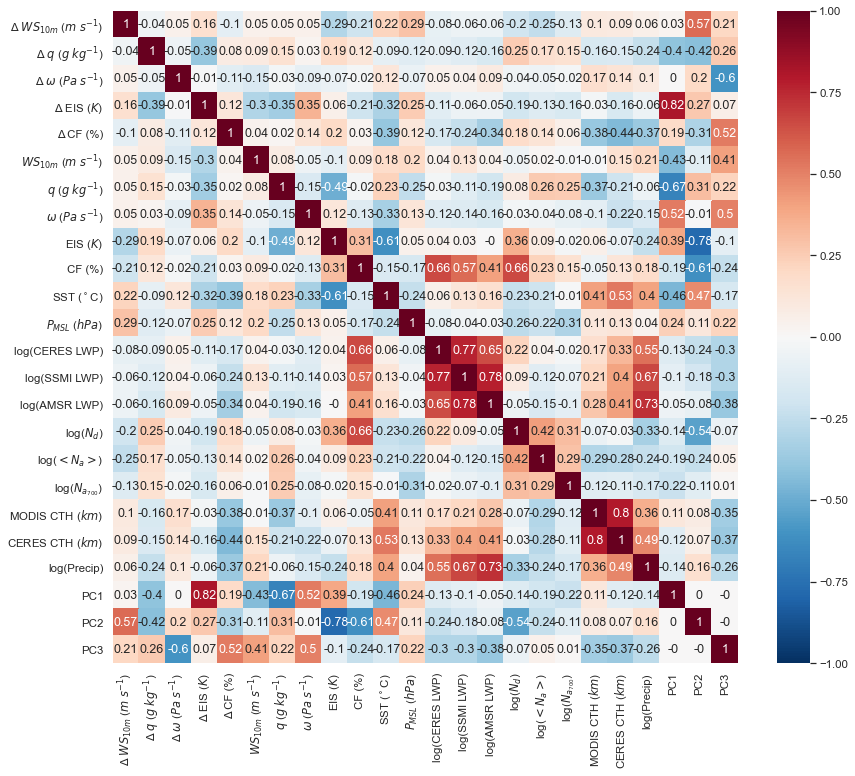

In [29]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)',  'Δ CF (%)']], \
                      df_mean, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

In [ ]:
# midl = df.shape[1] // 2
rows = df.columns[0:7]
cols = df.columns[7:16]

fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df[rows[i]].values
        var2 = df[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
        model = LinearRegression()
        model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
        r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5       

        xedges = np.arange(var1.min(),var1.max(), (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),var2.max(), (var2.max() - var2.min()) / 40)        
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r') #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)
        ###
        if rows[i] == 'Δ $ω$ ($Pa$ $s^{-1}$)':
            axis[i,j].set_xlim([-.3, .3])
        if rows[i] == 'Δ SST ($^\circ$C)':
            axis[i,j].set_xlim([0, 10])            
        if rows[i] == '$Δ P_{MSL}$ ($hPa$)':
            axis[i,j].set_xlim([-10, 8])            
        if cols[j] == 'Δ log(Precip)':
            axis[i,j].set_ylim([-3, 3])  
        if cols[j] == 'Δ log($<N_a>$)':
            axis[i,j].set_ylim([-1.2, .8])   
        if cols[j] in ['Δ log(CERES LWP)', 'Δ log(AMSR LWP)', 'Δ log(SSMI LWP)']:
            axis[i,j].set_ylim([-2, 2])
        if cols[j] in ['MODIS Δ CTH ($km$)', 'CERES Δ CTH ($km$)']:
            axis[i,j].set_ylim([-2, 2.2])
        if cols[j] in ['Δ log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([-1.5, 1.5])              
    
        ###
        var1 = df[rows[i]].values
        var2 = df[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df.index - l1) == np.nanmin(abs(df.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df.index - l2) == np.nanmin(abs(df.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '25')
        axis[i,j].set_ylabel(cols[j], fontsize = '25')
        axis[i,j].tick_params(axis='both', which='major', labelsize=22)
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

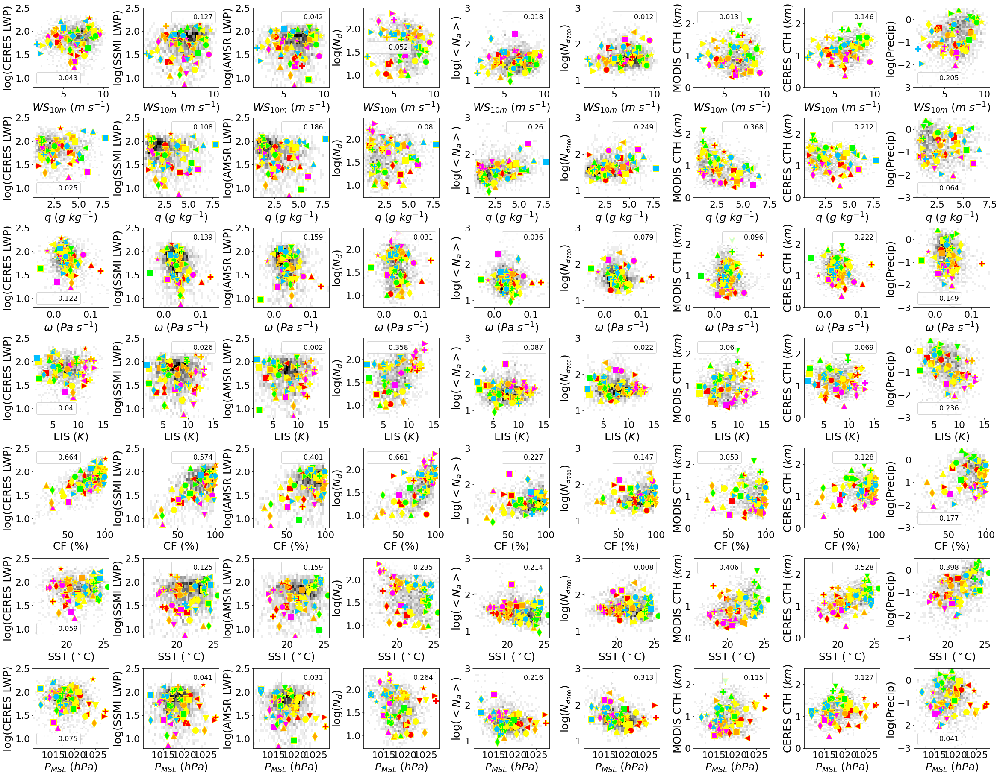

In [10]:
midl = df_mean.shape[1] // 2
rows = df_mean.columns[0:7]
cols = df_mean.columns[7:16]

fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_mean[rows[i]].values
        var2 = df_mean[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)], \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)]
        
        model = LinearRegression()
        model.fit(var1.reshape(-1, 1), var2.reshape(-1, 1))
        r_val = ( model.score(var1.reshape(-1, 1), var2.reshape(-1, 1)) ) ** 0.5       

        xedges = np.arange(var1.min(),var1.max(), (var1.max() - var1.min()) / 40)
        yedges = np.arange(var2.min(),var2.max(), (var2.max() - var2.min()) / 40)        
#         xedges = np.arange(np.nanmin(var1), np.nanmax(var1), (np.nanmax(var1) - np.nanmin(var1)) / 40)
#         yedges = np.arange(np.nanmin(var2), np.nanmax(var2), (np.nanmax(var2) - np.nanmin(var2)) / 40)
        H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
        H = H.T
        #H[H < 4] = np.nan

        vmin,vmax = 0, 15
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        ticks=np.arange(0, 20, 5)        

#        axis[i,j].scatter(var1, var2, c='darkblue')
        axis[i,j].scatter(xedges[0], yedges[0], c='w', label=str(np.round(r_val,3)))
        csf = axis[i,j].pcolormesh(xedges, yedges, H, norm=norm, cmap='gray_r', label=str(np.round(r_val,3))) #gnuplot2 #viridis #**kwargs
        axis[i,j].legend(fontsize=16)

        ###
        if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
            axis[i,j].set_ylim([.8, 2.5])
        if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
            axis[i,j].set_ylim([0, 2.5])
        if cols[j] in ['log($<N_a>$)', 'log($N_{a_{700}}$)']:
            axis[i,j].set_ylim([.8, 3])              
    
        ###
        var1 = df_mean[rows[i]].values
        var2 = df_mean[cols[j]].values
        
        for ii in range(len(traj_labels)):

            i_reg = np.where(region3 == ii)
    
#             l1 = (ii + 0) * df_mean.index[-1] // len(traj_labels)
#             l2 = (ii + 1) * df_mean.index[-1] // len(traj_labels)
#             ll1 = np.where( abs(df_mean.index - l1) == np.nanmin(abs(df_mean.index - l1)) ) [0][0]
#             ll2 = np.where( abs(df_mean.index - l2) == np.nanmin(abs(df_mean.index - l2)) ) [0][0] - 1  

            var1_s = var1[i_reg]
            var2_s = var2[i_reg]        

            for jjj in range(len(dots[ii])):
                #try:
                axis[i,j].scatter(var1_s[dots[ii]][jjj], var2_s[dots[ii]][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #except:
                #    axis[i,j].scatter(var1_s[dots[ii]-1][jjj], var2_s[dots[ii]-1][jjj], marker=markers[jjj], c=colors[ii],s=200, edgecolor='yellow')
                #    print(i, j, ii, jjj)
        axis[i,j].set_xlabel(rows[i], fontsize = '25')
        axis[i,j].set_ylabel(cols[j], fontsize = '25')
        axis[i,j].tick_params(axis='both', which='major', labelsize=22)
plt.tight_layout(pad=0)
# plt.savefig('phase_space.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## PCA based on variable differences and mean variables

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
dtype: int64


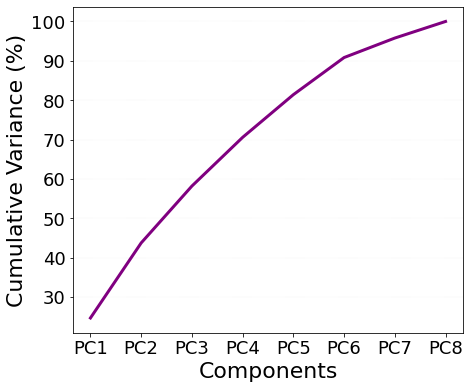

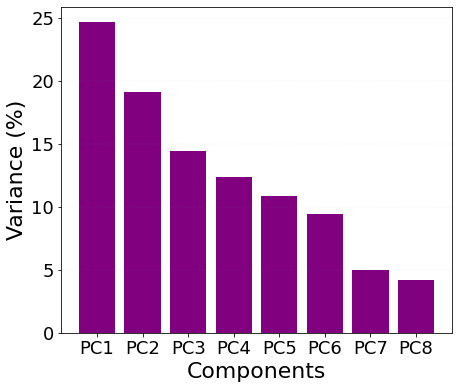

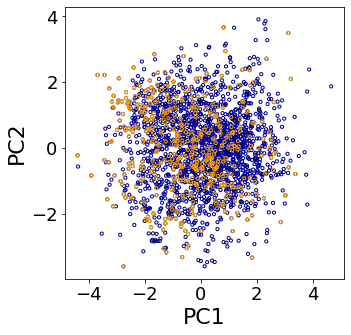

In [8]:
print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']].isna().sum())
print(df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], \
          df_mean['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean['$q$ ($g$ $kg^{-1}$)'], df_mean['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean['EIS ($K$)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[7,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[7,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values

df_ice = df_input[df['CERES IWP Occurence'] >= 3]
PC1_ice = df_ice['PC1'].values
PC2_ice = df_ice['PC2'].values

###
fig, axis = plt.subplots(1, 1, figsize=(5,5))#,
plt.scatter(PC1, PC2        , s=10, facecolors='none', edgecolors='darkblue')
plt.scatter(PC1_ice, PC2_ice, s=10, facecolors='none', edgecolors='orange')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
#axis.grid(linestyle=':', axis='y', linewidth=1)
axis.tick_params(axis='both', which='major', labelsize=18)
#plt.savefig('tseries_' + TITLE + '.png', bbox_inches='tight')
plt.show()

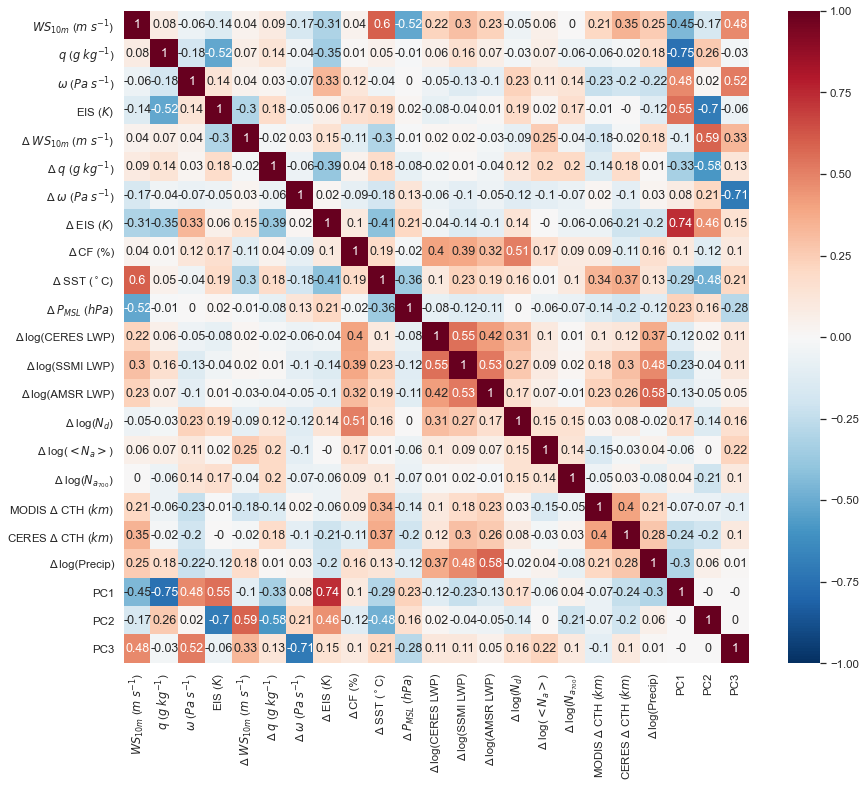

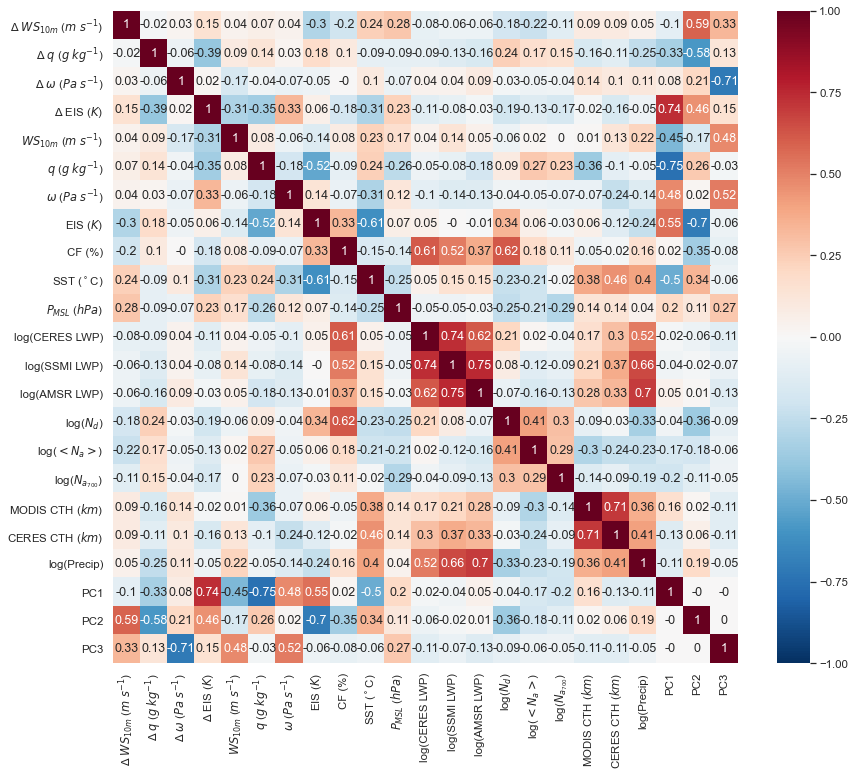

In [9]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']], \
                      df_mean, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

## PCA based on variable differences and mean variables
## Including CF in PCA

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
Δ CF (%)                       0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
CF (%)                       0
dtype: int64


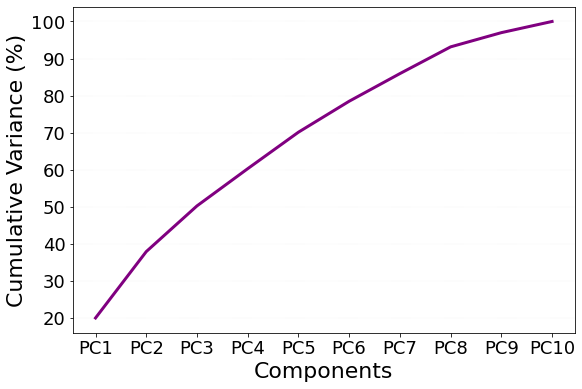

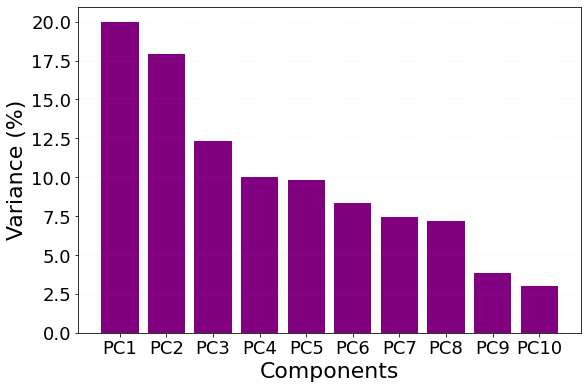

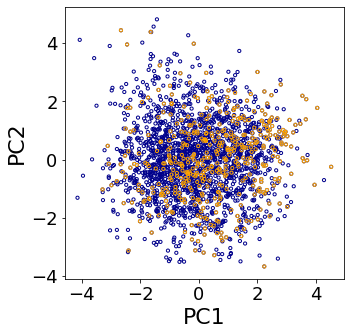

In [9]:
print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)', 'Δ CF (%)']].isna().sum())
print(df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], df['Δ CF (%)'], \
          df_mean['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean['$q$ ($g$ $kg^{-1}$)'], df_mean['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean['EIS ($K$)'], df_mean['CF (%)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[9,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[9,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values

df_ice = df_input[df['CERES IWP Occurence'] >= 3]
PC1_ice = df_ice['PC1'].values
PC2_ice = df_ice['PC2'].values

###
fig, axis = plt.subplots(1, 1, figsize=(5,5))#,
plt.scatter(PC1, PC2        , s=10, facecolors='none', edgecolors='darkblue')
plt.scatter(PC1_ice, PC2_ice, s=10, facecolors='none', edgecolors='orange')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
#axis.grid(linestyle=':', axis='y', linewidth=1)
axis.tick_params(axis='both', which='major', labelsize=18)
#plt.savefig('tseries_' + TITLE + '.png', bbox_inches='tight')
plt.show()

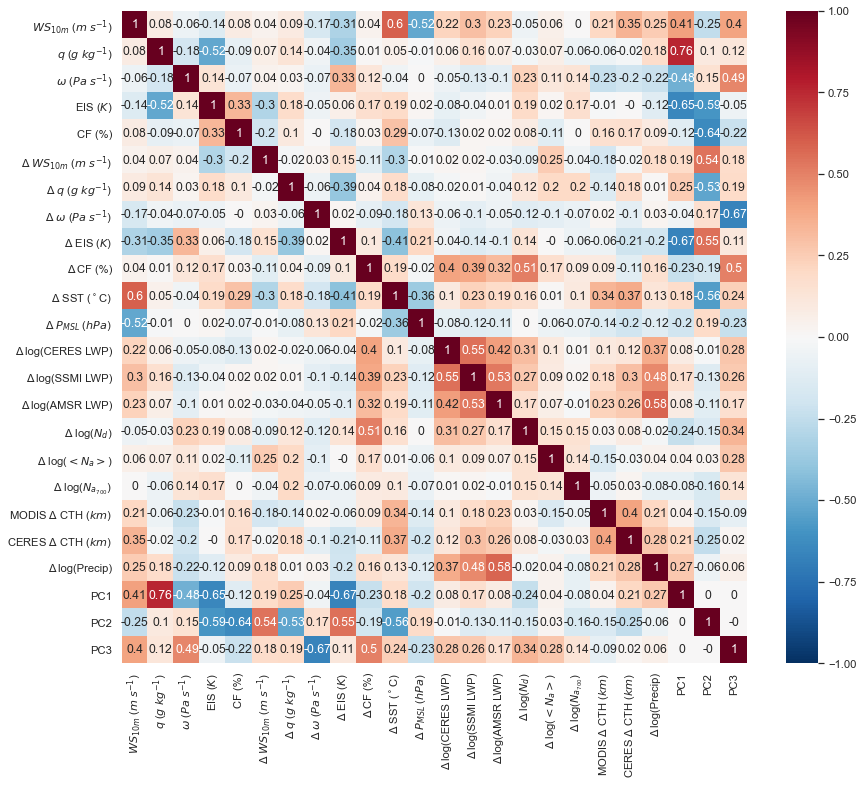

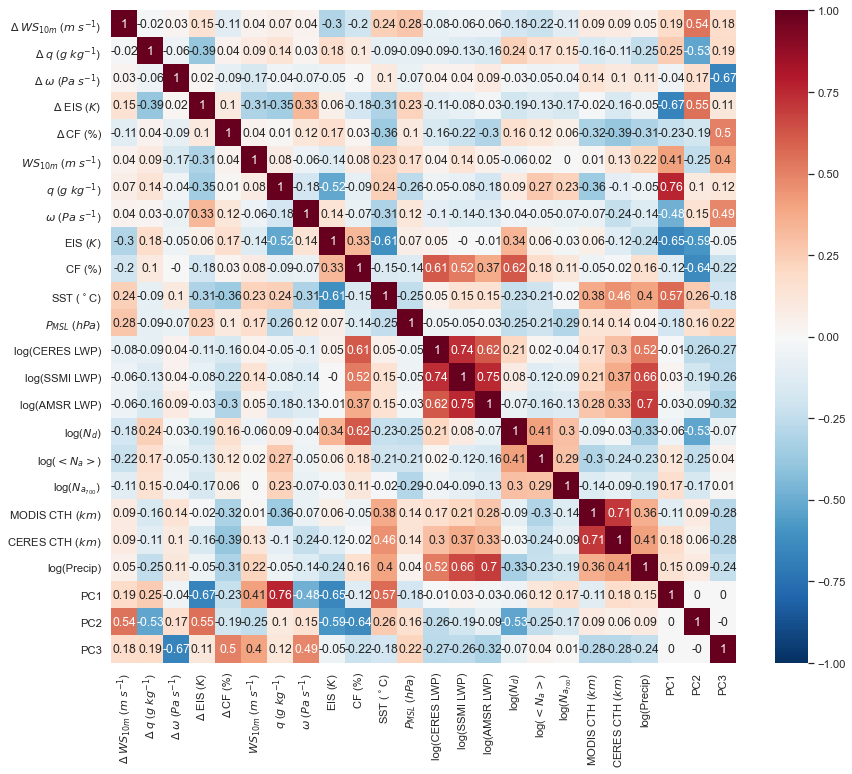

In [11]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.02)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)', 'Δ CF (%)']], \
                      df_mean, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.02)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

## PCA based on variable differences and deseasonalized mean variables
### Variables averaged along trajectories and deseasonalized

[-1.03469131 -0.02664691  0.02065902 ... -0.52697346 -0.64757503
 -0.85538089]


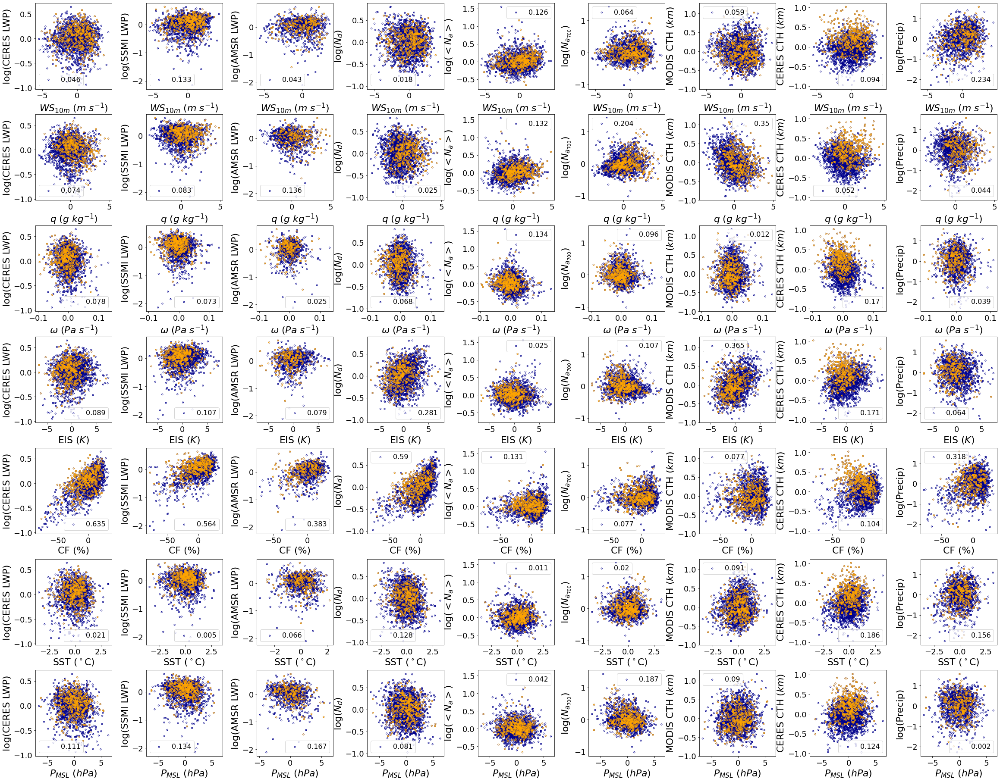

In [10]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

def process(var):
    hlf_rg   = 15
    days     = 92
    var_mean = np.nanmean(var,0)
    seas_mean= var_mean[:,0,:].copy()
    seas_mean[:] = np.nan

    for ii in range(var_mean.shape[0]):
        for jj in range(var_mean.shape[2]):
            l1  = max(0, ii - hlf_rg)
            l2  = min(ii + hlf_rg + 1, 92)
            tmp = var_mean[l1:l2,:,jj]
            seas_mean[ii,jj] = np.nanmean(tmp)

    output    = var_mean.copy()
    output[:] = np.nan
    for i in range(var_mean.shape[1]):
        output[:,i,:] = var_mean[:,i,:] - seas_mean
    output = output.reshape(-1)
    output = output[i_nonan]
    return output

# days_all = var_mean.copy()
# days_all[:] = np.nan
# for i in range(days_all.shape[1]):
#     for j in range(days_all.shape[2]):
#         days_all[:,i,j] = np.arange(1,93)
# days_all = days_all.reshape(-1)
# days_all = days_all[i_nonan]

era5_sst_anomn_dly_t_df  = pd.DataFrame(process(ERA_SST  ), columns=['SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process(ERA_WS10 ), columns=['$WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process(ERA_Pmsl ), columns=['$P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process(ERA_q_700), columns=['$q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process(ERA_w_700), columns=['$ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process(ERA_EIS  ), columns=['EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process(CERES_cld), columns=['CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process(np.log10(CERES_lwp) ), columns=['log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process(np.log10(SSMI_lwp ) ), columns=['log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process(np.log10(AMSR_lwp ) ), columns=['log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process(np.log10(CERES_Nd) ), columns=['log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process(np.log10(MERRA_Na_m)),columns=['log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process(np.log10(MERRA_Na_700)),columns=['log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process(MODIS_CTH), columns=['MODIS CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process(CERES_CTH), columns=['CERES CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(process(np.log10(AMSR_prec) ), columns=['log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan, columns=['CERES IWP Occurence'])

amsr_lwp_anomn_dly_t_df[np.isinf(amsr_lwp_anomn_dly_t_df)] = np.nan
amsr_prec_anomn_dly_t_df[np.isinf(amsr_prec_anomn_dly_t_df)] = np.nan

df_mean_des = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df ,  era5_sst_anomn_dly_t_df, \
                era5_pmsl_anomn_dly_t_df, ceres_lwp_anomn_dly_t_df, ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

print(process(ERA_SST  ).reshape(-1)[~np.isnan(process(ERA_SST  ).reshape(-1))])


###### Plotting
rows = df_mean_des.columns[0:7]
cols = df_mean_des.columns[7:16]

df_mean_des_ice = df_mean_des[df_mean_des['CERES IWP Occurence'] >= 3]

###
fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_mean_des[rows[i]].values
        var2 = df_mean_des[cols[j]].values
        
        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1), \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1)
        model = LinearRegression()
        model.fit(var1, var2)
        r_val = ( model.score(var1, var2) ) ** 0.5       
        
        var1_ice = df_mean_des_ice[rows[i]].values
        var2_ice = df_mean_des_ice[cols[j]].values
        
#         if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
#             axis[i,j].set_ylim([.8, 2.5])
#         if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
#             axis[i,j].set_ylim([0, 2.5])
#         if cols[j] in ['log($<N_a>$)', 'log($N_{a_{700}}$)']:
#             axis[i,j].set_ylim([.8, 3])            
        axis[i,j].scatter(var1, var2        , s=10, facecolors='none', edgecolors='darkblue', label=str(np.round(r_val,3)))
        axis[i,j].scatter(var1_ice, var2_ice, s=10, facecolors='none', edgecolors='orange')
        axis[i,j].set_xlabel(rows[i], fontsize = '22')
        axis[i,j].set_ylabel(cols[j], fontsize = '22')
        axis[i,j].tick_params(axis='both', which='major', labelsize=18)
        axis[i,j].legend(fontsize=16)
plt.tight_layout(pad=0)
plt.show()

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
dtype: int64


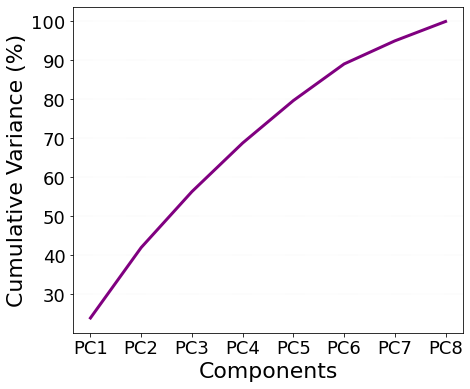

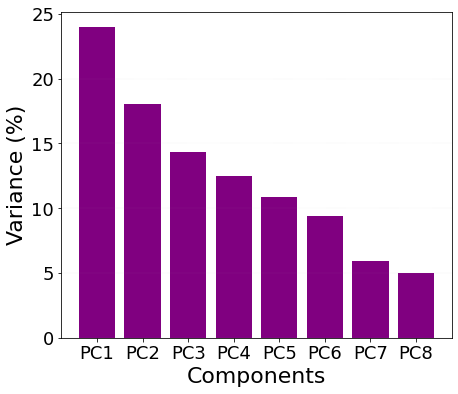

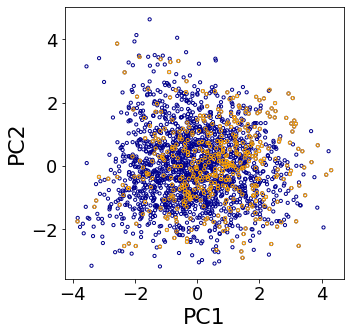

In [11]:
print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']].isna().sum())
print(df_mean_des[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], \
          df_mean_des['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean_des['$q$ ($g$ $kg^{-1}$)'], df_mean_des['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean_des['EIS ($K$)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[7,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[7,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values

df_ice = df_input[df['CERES IWP Occurence'] >= 3]
PC1_ice = df_ice['PC1'].values
PC2_ice = df_ice['PC2'].values

###
fig, axis = plt.subplots(1, 1, figsize=(5,5))#,
plt.scatter(PC1, PC2        , s=10, facecolors='none', edgecolors='darkblue')
plt.scatter(PC1_ice, PC2_ice, s=10, facecolors='none', edgecolors='orange')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
#axis.grid(linestyle=':', axis='y', linewidth=1)
axis.tick_params(axis='both', which='major', labelsize=18)
#plt.savefig('tseries_' + TITLE + '.png', bbox_inches='tight')
plt.show()

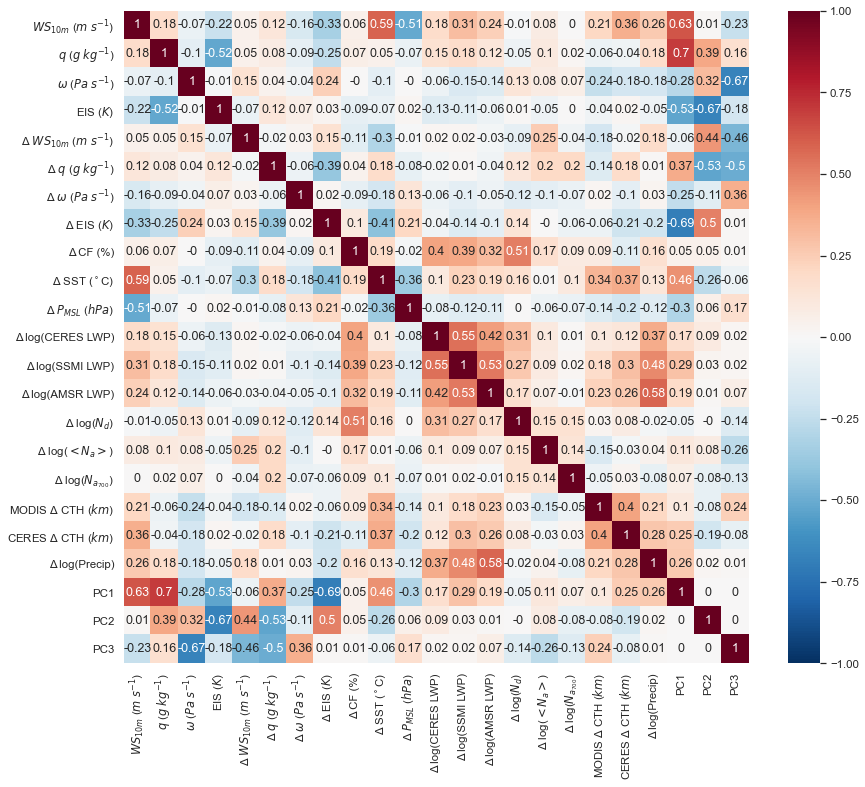

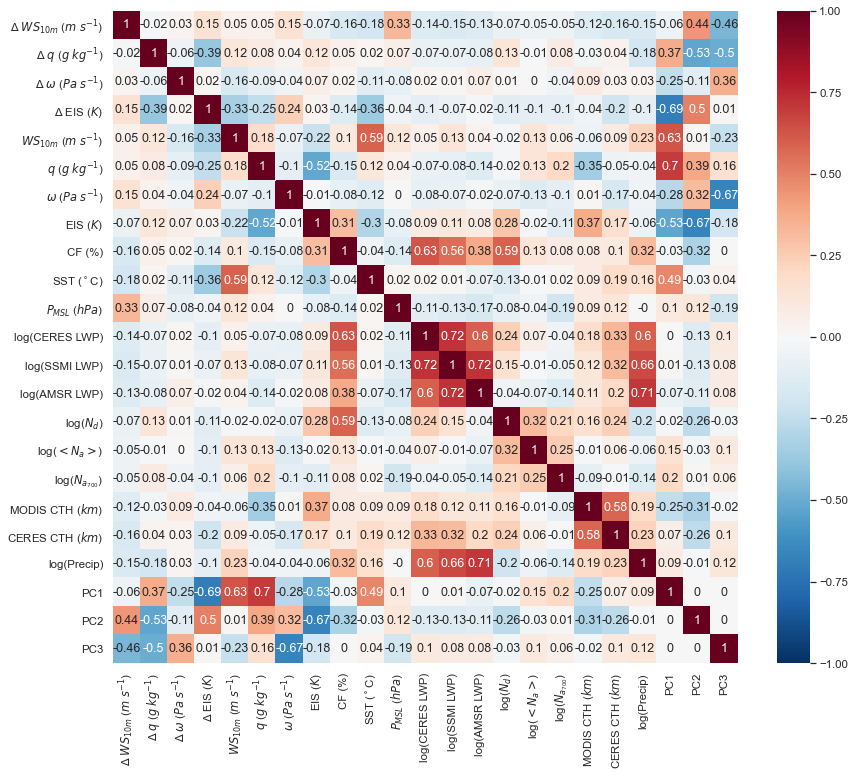

In [14]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean_des[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']], \
                      df_mean_des, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

## PCA based on variable differences and deseasonalized mean variables
### Variables averaged along trajectories and deseasonalized
## Including CF in PCA

Δ $WS_{10m}$ ($m$ $s^{-1}$)    0
Δ $q$ ($g$ $kg^{-1}$)          0
Δ $ω$ ($Pa$ $s^{-1}$)          0
Δ EIS ($K$)                    0
Δ CF (%)                       0
dtype: int64
$WS_{10m}$ ($m$ $s^{-1}$)    0
$q$ ($g$ $kg^{-1}$)          0
$ω$ ($Pa$ $s^{-1}$)          0
EIS ($K$)                    0
CF (%)                       0
dtype: int64


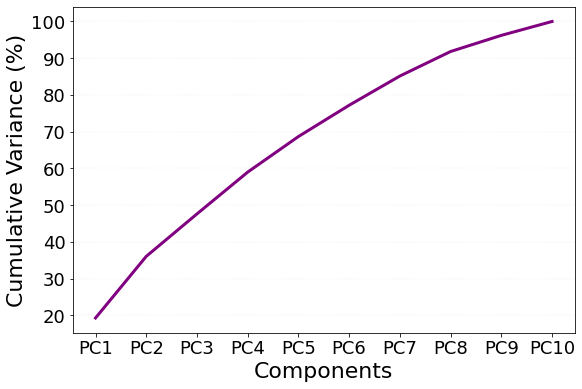

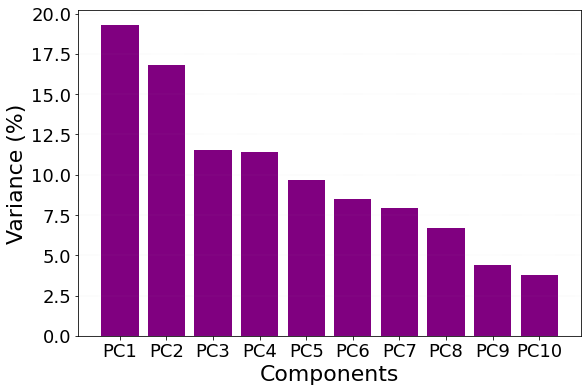

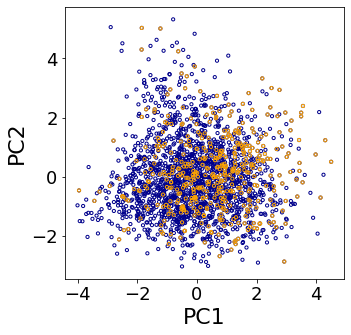

In [12]:
print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)', 'Δ CF (%)']].isna().sum())
print(df_mean_des[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], df['Δ CF (%)'], \
          df_mean_des['$WS_{10m}$ ($m$ $s^{-1}$)'], df_mean_des['$q$ ($g$ $kg^{-1}$)'], df_mean_des['$ω$ ($Pa$ $s^{-1}$)'], \
          df_mean_des['EIS ($K$)'], df_mean_des['CF (%)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[9,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[9,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values

df_ice = df_input[df['CERES IWP Occurence'] >= 3]
PC1_ice = df_ice['PC1'].values
PC2_ice = df_ice['PC2'].values

###
fig, axis = plt.subplots(1, 1, figsize=(5,5))#,
plt.scatter(PC1, PC2        , s=10, facecolors='none', edgecolors='darkblue')
plt.scatter(PC1_ice, PC2_ice, s=10, facecolors='none', edgecolors='orange')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
#axis.grid(linestyle=':', axis='y', linewidth=1)
axis.tick_params(axis='both', which='major', labelsize=18)
#plt.savefig('tseries_' + TITLE + '.png', bbox_inches='tight')
plt.show()

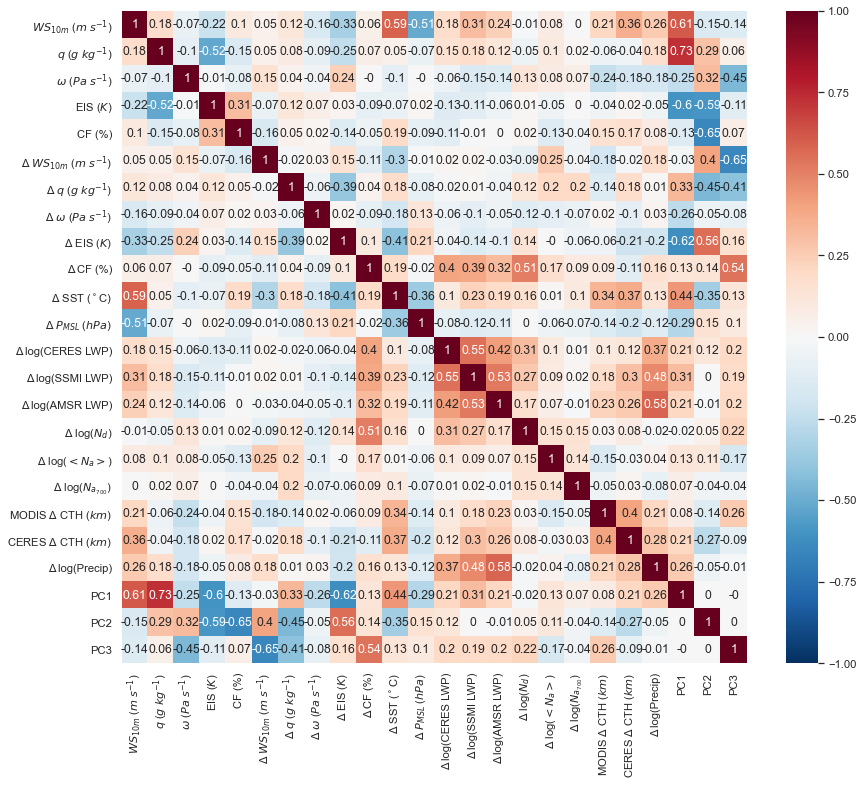

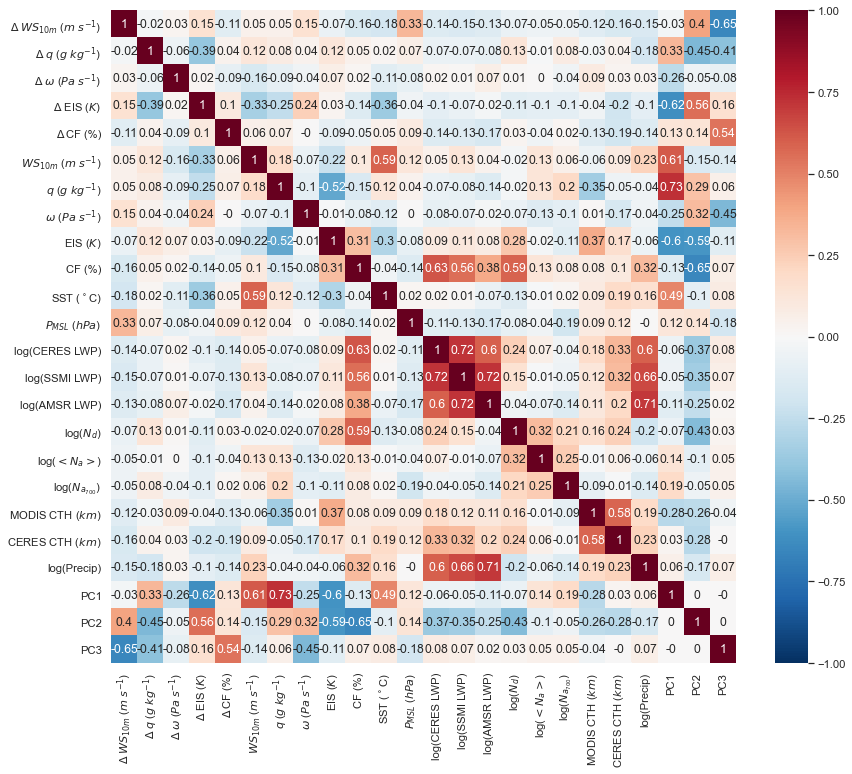

In [16]:
# Concatenate all variables and PCs
df_all = pd.concat([df_mean_des[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)', 'CF (%)']], \
                      df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.02)
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

###
df_all = pd.concat([df[['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)', 'Δ CF (%)']], \
                      df_mean_des, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
###
plt.figure(figsize=(14,12))
sb.set(font_scale=1.02)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

## Variables at the start of trajectories 

In [ ]:
ERA_SST_1D = np.nanmean(ERA_SST,0).reshape(-1)
i_nonan = np.where(np.isnan(ERA_SST_1D) == 0)[0]

CERES_iwp_occur_nonan = CERES_iwp_occur.reshape(-1)
CERES_iwp_occur_nonan = CERES_iwp_occur_nonan[i_nonan]

def create_deseasonalized(var):
    var_deseas = var.copy()
    var_deseas[:] = np.nan
    var_m = np.nanmean(var,2)
    for i in range(var.shape[2]):
        var_deseas[:,:,i,:] = var[:,:,i,:] - var_m
    return var_deseas

def process_start(var):
    var = create_deseasonalized(var)
    var_delta = var[0,:,:,:].copy()
    for i in range(var.shape[1]):
        for j in range(var.shape[2]):
            for k in range(var.shape[3]):
                temp = var[:,i,j,k].copy()
                var_nonan = temp[np.isnan(temp) == 0]
                if len(var_nonan) > 30:
                    var_delta[i,j,k] = np.nanmean(var_nonan[:4])
                else:
                    try:
                        var_delta[i,j,k] = var_nonan[0]            
                    except:
                        var_delta[i,j,k] = np.nan
    var_delta = var_delta.reshape(-1)
    var_delta = var_delta[i_nonan]                
    return var_delta

###
AMSR_prec_des = create_deseasonalized(AMSR_prec)
var = np.log10(AMSR_prec)
var_delta = var[0,:,:,:].copy()
for i in range(var.shape[1]):
    for j in range(var.shape[2]):
        for k in range(var.shape[3]):
            var_delta[i,j,k] = np.nanmean(var[:,i,j,k][:24])
var_delta = var_delta.reshape(-1)
var_delta = var_delta[i_nonan] 

AMSR_prec_delta = var_delta.copy()

###
era5_sst_anomn_dly_t_df  = pd.DataFrame(process_start(ERA_SST  ), columns=['SST ($^\circ$C)'])
era5_ws10_anomn_dly_t_df = pd.DataFrame(process_start(ERA_WS10 ), columns=['$WS_{10m}$ ($m$ $s^{-1}$)'])
era5_pmsl_anomn_dly_t_df = pd.DataFrame(process_start(ERA_Pmsl ), columns=['$P_{MSL}$ ($hPa$)'])
era5_q700_anomn_dly_t_df = pd.DataFrame(process_start(ERA_q_700), columns=['$q$ ($g$ $kg^{-1}$)'])
era5_w700_anomn_dly_t_df = pd.DataFrame(process_start(ERA_w_700), columns=['$ω$ ($Pa$ $s^{-1}$)'])
era5_eis_anomn_dly_t_df  = pd.DataFrame(process_start(ERA_EIS  ), columns=['EIS ($K$)'])
modis_cf_anomn_dly_t_df  = pd.DataFrame(process_start(CERES_cld), columns=['CF (%)'])
# ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_start(CERES_lwp ),columns=['CERES LWP ($g$ $m^{-2}$)'])
# ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(SSMI_lwp ), columns=['SSMI LWP ($g$ $m^{-2}$)'])
# amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(AMSR_lwp ), columns=['AMSR LWP ($g$ $m^{-2}$)'])
ceres_lwp_anomn_dly_t_df = pd.DataFrame(process_start(np.log10(CERES_lwp) ), columns=['log(CERES LWP)'])
ssmi_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(SSMI_lwp ) ), columns=['log(SSMI LWP)'])
amsr_lwp_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(AMSR_lwp ) ), columns=['log(AMSR LWP)'])
# modis_nd_anomn_dly_t_df  = pd.DataFrame(process_start(CERES_Nd ), columns=['$N_d$ ($cm^{-3}$)'])
# merra_na_anomn_dly_t_df  = pd.DataFrame(process_start(MERRA_Na_m),columns=['$N_a$ ($cm^{-3}$)'])
modis_nd_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(CERES_Nd) ), columns=['log($N_d$)'])
merra_na_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(MERRA_Na_m)),columns=['log($<N_a>$)'])
merra_na_700_anomn_dly_t_df  = pd.DataFrame(process_start(np.log10(MERRA_Na_700)),columns=['log($N_{a_{700}}$)'])
modis_cth_anomn_dly_t_df = pd.DataFrame(process_start(MODIS_CTH), columns=['MODIS CTH ($km$)'])
ceres_cth_anomn_dly_t_df = pd.DataFrame(process_start(CERES_CTH), columns=['CERES CTH ($km$)'])
amsr_prec_anomn_dly_t_df = pd.DataFrame(AMSR_prec_delta, columns=['log(Precip)'])
ceres_iwp_occurance_t_df = pd.DataFrame(CERES_iwp_occur_nonan   , columns=['CERES IWP Occurence'])

df_start = pd.concat([era5_ws10_anomn_dly_t_df, era5_q700_anomn_dly_t_df, era5_w700_anomn_dly_t_df, \
                era5_eis_anomn_dly_t_df , modis_cf_anomn_dly_t_df , era5_sst_anomn_dly_t_df , \
                era5_pmsl_anomn_dly_t_df, ceres_lwp_anomn_dly_t_df, ssmi_lwp_anomn_dly_t_df , \
                amsr_lwp_anomn_dly_t_df , modis_nd_anomn_dly_t_df , merra_na_anomn_dly_t_df , merra_na_700_anomn_dly_t_df, \
                modis_cth_anomn_dly_t_df, ceres_cth_anomn_dly_t_df, amsr_prec_anomn_dly_t_df, \
                ceres_iwp_occurance_t_df], axis = 1)

#######
rows = df_start.columns[0:7]
cols = df_start.columns[7:16]

df_ice = df_start[df_start['CERES IWP Occurence'] >= 3]

###
fig, axis = plt.subplots(7, 9, figsize=(32,25))
    
for i in range(len(rows)):
    for j in range(len(cols)):

        var1 = df_start[rows[i]].values
        var2 = df_start[cols[j]].values

        var1[np.isinf(var1)] = np.nanmedian(var1)
        var2[np.isinf(var2)] = np.nanmedian(var2)
        var1, var2 = var1[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1), \
                     var2[(np.isnan(var1) == 0) & (np.isnan(var2) == 0)].reshape(-1, 1)
        model = LinearRegression()
        model.fit(var1, var2)
        r_val = ( model.score(var1, var2) ) ** 0.5       
        
        var1_ice = df_ice[rows[i]].values
        var2_ice = df_ice[cols[j]].values
        
#         if rows[i] == '$ω$ ($Pa$ $s^{-1}$)':
#             axis[i,j].set_xlim([-.2, .3])
# #         if rows[i] == 'SST ($^\circ$C)':
# #             axis[i,j].set_xlim([0, 10])            
# #         if rows[i] == '$P_{MSL}$ ($hPa$)':
# #             axis[i,j].set_xlim([-10, 8])            
# #         if cols[j] == 'log(Precip)':
# #             axis[i,j].set_ylim([-3, 3])  
#         if cols[j] == 'log($<N_a>$)':
#             axis[i,j].set_ylim([.7, 3])              
            
#         if cols[j] in ['log(CERES LWP)', 'log(AMSR LWP)', 'log(SSMI LWP)']:
#             axis[i,j].set_ylim([0, 3.3])
#         if cols[j] in ['MODIS CTH ($km$)', 'CERES CTH ($km$)']:
#             axis[i,j].set_ylim([0, 2.8])
#         if cols[j] in ['log($N_{a_{700}}$)']:
#             axis[i,j].set_ylim([.7, 3])              
            
        axis[i,j].scatter(var1, var2        , s=10, facecolors='none', edgecolors='darkblue', label=str(np.round(r_val,3)))
        axis[i,j].scatter(var1_ice, var2_ice, s=10, facecolors='none', edgecolors='orange')
        axis[i,j].set_xlabel(rows[i], fontsize = '22')
        axis[i,j].set_ylabel(cols[j], fontsize = '22')
        axis[i,j].tick_params(axis='both', which='major', labelsize=18)
        axis[i,j].legend(fontsize=16)
plt.tight_layout(pad=0)
plt.show()

## PCA based on variable differences and variables at start

In [ ]:
print(df      [['Δ $WS_{10m}$ ($m$ $s^{-1}$)', 'Δ $q$ ($g$ $kg^{-1}$)', 'Δ $ω$ ($Pa$ $s^{-1}$)', 'Δ EIS ($K$)']].isna().sum())
print(df_start[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']].isna().sum())

#### Standardize the data:
df_input = pd.concat([df['Δ $WS_{10m}$ ($m$ $s^{-1}$)'], df['Δ $q$ ($g$ $kg^{-1}$)'], df['Δ $ω$ ($Pa$ $s^{-1}$)'], df['Δ EIS ($K$)'], \
          df_start['$WS_{10m}$ ($m$ $s^{-1}$)'], df_start['$q$ ($g$ $kg^{-1}$)'], df_start['$ω$ ($Pa$ $s^{-1}$)'], \
          df_start['EIS ($K$)']], axis = 1)
# df_input = df_input.dropna
matrix   = df_input.values 
sc = StandardScaler()
matrix_sc = sc.fit_transform(matrix)

#### Perform PCA:
pca = PCA()
matrix_pca = pca.fit(matrix_sc)

COMPS_LABELS = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12'] # np.arange(1,len(pca.components_) + 1)
COMPS = COMPS_LABELS[:len(pca.components_)]

#### Determine the number of components:
%matplotlib inline
plt.figure(figsize=[7,6])
plt.plot(COMPS, np.cumsum(pca.explained_variance_ratio_ * 100), c='purple', linewidth=3)
plt.xlabel('Components', fontsize=22)
plt.ylabel('Cumulative Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.show()
plt.close()

#####
%matplotlib inline
plt.figure(figsize=[7,6])
plt.bar(COMPS, pca.explained_variance_ratio_ * 100, color='purple')
plt.xlabel('Components', fontsize=22)
plt.ylabel('Variance (%)', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(linestyle=':', axis='y', linewidth=.125)
plt.savefig('Variance.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()
plt.close()

#### Find important features
pca_comp_df = pd.DataFrame(pca.components_, columns = df_input.columns)
COMPS_df    = pd.DataFrame(COMPS)
pd.concat([COMPS_df, pca_comp_df], axis = 1)


#####
# matrix_inversed = sc.inverse_transform(matrix_reconst)

matrix_reconst = pca.fit_transform(matrix_sc)  # Reconstruct signals based on orthogonal components
df_reconst = pd.DataFrame(matrix_reconst, columns = COMPS)
#df_reconst = pd.DataFrame(matrix_sc, columns = COMPS)

df_input = pd.concat([df_input, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)


##############
PC1 = df_reconst['PC1'].values
PC2 = df_reconst['PC2'].values
PC3 = df_reconst['PC3'].values

df_ice = df_input[df['CERES IWP Occurence'] >= 3]
PC1_ice = df_ice['PC1'].values
PC2_ice = df_ice['PC2'].values

###
fig, axis = plt.subplots(1, 1, figsize=(5,5))#,
plt.scatter(PC1, PC2        , s=10, facecolors='none', edgecolors='darkblue')
plt.scatter(PC1_ice, PC2_ice, s=10, facecolors='none', edgecolors='orange')
axis.set_xlabel('PC1', fontsize = '22')
axis.set_ylabel('PC2', fontsize = '22')
#axis.grid(linestyle=':', axis='y', linewidth=1)
axis.tick_params(axis='both', which='major', labelsize=18)
#plt.savefig('tseries_' + TITLE + '.png', bbox_inches='tight')
plt.show()

In [ ]:
df_all = pd.concat([df_start[['$WS_{10m}$ ($m$ $s^{-1}$)', '$q$ ($g$ $kg^{-1}$)', '$ω$ ($Pa$ $s^{-1}$)', 'EIS ($K$)']], \
                    df, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1)
# df_all[np.isinf(df_all) == 1] = np.nan

#####
plt.figure(figsize=(14,12))
sb.set(font_scale=1.04)
# sb.heatmap(round(df_all.drop(['CERES IWP Occurence'], inplace = True, axis=1).corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
sb.heatmap(round(df_all.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
plt.show()
plt.close()

#####
plt.figure(figsize=(12,10))
sb.set(font_scale=1.7)
fgg = sb.pairplot(df_all, corner=True, palette='Dark2', plot_kws={"s": 10})#, ec='face')# hls, paired,  markers = 'o', diag_kind="hist", kind="hist"
# fgg.fig.suptitle(TITLE, y=1.0, fontsize=40)
plt.show()
plt.close()

# df_start = pd.concat([df_start, df_reconst['PC1'], df_reconst['PC2'], df_reconst['PC3']], axis=1)
# df_start.drop(['CERES IWP Occurence'], inplace = True, axis=1)
# ###
# plt.figure(figsize=(12,10))
# sb.set(font_scale=1.05)
# sb.heatmap(round(df_start.corr(),2), vmin=-1, vmax=1, annot=True, cmap = 'RdBu_r')
# plt.show()
# plt.close()

## Other tests

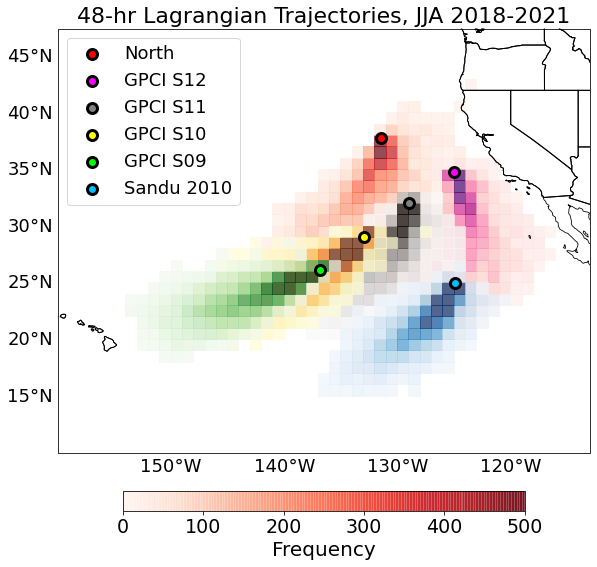

In [4]:
colors    = ['red' , 'magenta', 'grey' , 'yellow', 'lime'  , 'deepskyblue']
colormaps = ['Reds', 'RdPu'   , 'Greys', 'YlOrBr', 'Greens', 'Blues' ]
proj      = ccrs.PlateCarree()
traj_t    = 48

######
fig   = plt.figure(figsize=(12,10))
ax    = plt.axes(projection = proj)

    
for i, traj_loc in enumerate(traj_locs):
    lat_all = []
    lon_all = []
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]
                
                lat_all.extend(lat_ftr)
                lon_all.extend(lon_ftr)
                

                if traj_dirc == ['forward', 'backward']:
                    btr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                          + date + HH + '00.airmass_trajectories_500m_-48.txt'

                    df_btr  = pd.read_fwf(btr, delimiter = " ")
                    arr_btr = df_btr[start_row:].to_numpy()
                    lat_btr = arr_btr[:traj_t+1,i_lat]
                    lon_btr = arr_btr[:traj_t+1,i_lon]

                #####
    var1 = np.array(lon_all)
    var2 = np.array(lat_all)
    
    xedges = np.arange(-170,-105 )
    yedges = np.arange(0, 50 )
    H, xedges, yedges = np.histogram2d(var1, var2, bins=(xedges, yedges))
    H = H.T
    H[H < 20] = np.nan

    vmin,vmax = 0, 500
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    ticks=np.arange(0, 550, 100)     


    #        axis[i,j].scatter(var1, var2, c='darkblue')
    csf = ax.pcolor(xedges, yedges, H, cmap=colormaps[i], norm=norm, alpha=0.7) #gnuplot2 #viridis #**kwargs
    if i == 0:
        cb = plt.colorbar(csf, shrink=.6, pad=0.07, orientation='horizontal', ticks=ticks)
        cb.ax.tick_params(labelsize=19)
        cb.ax.set_xlabel('Frequency', fontsize=20)
        
for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = ax.scatter(start_point[1], start_point[0],  marker='o', c=colors[i], edgecolor='k', linewidth=3, s=100, transform = ccrs.PlateCarree(), label=traj_labels[i])


ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}
#    legend.get_frame().set_alpha(None)
            
legend = ax.legend(fontsize=18)    
plt.savefig('Trajectories_freqs.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

In [ ]:
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
proj    = ccrs.PlateCarree()
traj_t  = 48
######
fig   = plt.figure(figsize=(12,8))
ax    = plt.axes(projection = proj)

###    
for i, traj_loc in enumerate(traj_locs):
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]

                if traj_dirc == ['forward', 'backward']:
                    btr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                          + date + HH + '00.airmass_trajectories_500m_-48.txt'

                    df_btr  = pd.read_fwf(btr, delimiter = " ")
                    arr_btr = df_btr[start_row:].to_numpy()
                    lat_btr = arr_btr[:traj_t+1,i_lat]
                    lon_btr = arr_btr[:traj_t+1,i_lon]
                
                #####
                cf_f  = ax.plot(lon_ftr, lat_ftr, '-', color=colors[i], linewidth=1, transform = ccrs.PlateCarree(), \
                               alpha=0.3)#, solid_capstyle="butt")
                #cf_f1 = ax.scatter(lon_ftr[0:-1:6], lat_ftr[0:-1:6], marker='o', color='darkblue', s=40, transform = ccrs.PlateCarree())
                if traj_dirc == ['forward', 'backward']:
                    cf_b  = ax.plot(lon_btr, lat_btr, '-', color=colors[i], linewidth=5, transform = ccrs.PlateCarree())
                #    cf_b1 = ax.scatter(lon_btr[0:-1:6], lat_btr[0:-1:6], marker='o', color='cyan', s=40, transform = ccrs.PlateCarree())

###
for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = plt.plot(start_point[1], start_point[0],label=traj_labels[i], marker='o', c=colors[i], markeredgecolor='k', \
                     markersize=12, markeredgewidth=3, linestyle = 'None', transform=ccrs.PlateCarree())#   , edgecolor='k', linewidth=3, )#  s=100, 

###
date = '2021' + '07' + '07'
ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + '05' + '.'\
      + date + HH + '00.airmass_trajectories_500m_+72.txt'
df_ftr  = pd.read_fwf(ftr, delimiter = " ")
arr_ftr = df_ftr[start_row:].to_numpy()
lat_ftr = arr_ftr[:,i_lat]
lon_ftr = arr_ftr[:,i_lon]
cs0000  = plt.plot(lon_ftr, lat_ftr, '-', color='k', linewidth=3, transform = ccrs.PlateCarree())

###
ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}
#    legend.get_frame().set_alpha(None)

legend = ax.legend(fontsize=18)    
plt.savefig('Trajectories_sample_line.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## All trajectories with net equatorward movement

In [ ]:
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
proj    = ccrs.PlateCarree()
traj_t  = 48
######
fig   = plt.figure(figsize=(12,8))
ax    = plt.axes(projection = proj)

nn = 0

for i, traj_loc in enumerate(traj_locs):
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]
                
                start_point = [lat_ftr[0], lon_ftr[0]]
                end_point   = [lat_ftr[-1], lon_ftr[-1]]
                
                if start_point[0]> end_point[0]:
                    nn += 1                    
                    cf_f  = ax.plot(lon_ftr, lat_ftr, '-', color=colors[i], linewidth=1, transform = ccrs.PlateCarree(), \
                                   alpha=0.3)
                    
for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = plt.plot(start_point[1], start_point[0],label=traj_labels[i], marker='o', c=colors[i], markeredgecolor='k', \
                     markersize=12, markeredgewidth=3, linestyle = 'None', transform=ccrs.PlateCarree())
                      
ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}

legend = ax.legend(fontsize=18)    
#plt.savefig('Trajectories.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## All trajectories with net equatorward AND westward movement 

In [ ]:
colors  = ['red', 'magenta', 'orange', 'yellow', 'lime', 'deepskyblue']
proj    = ccrs.PlateCarree()
traj_t  = 48
######
fig   = plt.figure(figsize=(12,8))
ax    = plt.axes(projection = proj)

nn = 0

for i, traj_loc in enumerate(traj_locs):
    for y1 in range(len(YYYY)):
        for m1 in range(len(MM)):
            for d1 in range(1, DD[m1]+1):
                date = YYYY[y1] + MM[m1] + f"{d1:02d}"

                ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
                      + date + HH + '00.airmass_trajectories_500m_+72.txt'

                df_ftr  = pd.read_fwf(ftr, delimiter = " ")
                arr_ftr = df_ftr[start_row:].to_numpy()
                lat_ftr = arr_ftr[:traj_t+1,i_lat]
                lon_ftr = arr_ftr[:traj_t+1,i_lon]
                
                start_point = [lat_ftr[0], lon_ftr[0]]
                end_point   = [lat_ftr[-1], lon_ftr[-1]]
                
                if start_point[0]> end_point[0] and start_point[1]> end_point[1]:
                    nn += 1                    
                    cf_f  = ax.plot(lon_ftr, lat_ftr, '-', color=colors[i], linewidth=1, transform = ccrs.PlateCarree(), \
                                   alpha=0.3)
                    
for i, traj_loc in enumerate(traj_locs):
    date = YYYY[y1] + MM[m1] + f"{d1:02d}"

    ftr = '/home/disk/eos3/erfani/Data/'+camp+'/Trajectories/'+dn+'analysis.ERA5.' + traj_loc + '.'\
          + date + HH + '00.airmass_trajectories_500m_+72.txt'

    df_ftr  = pd.read_fwf(ftr, delimiter = " ")
    arr_ftr = df_ftr[start_row:].to_numpy()
    lat_ftr = arr_ftr[:,i_lat]
    lon_ftr = arr_ftr[:,i_lon]
    start_point = [lat_ftr[0], lon_ftr[0]]
    csf01 = plt.plot(start_point[1], start_point[0],label=traj_labels[i], marker='o', c=colors[i], markeredgecolor='k', \
                     markersize=12, markeredgewidth=3, linestyle = 'None', transform=ccrs.PlateCarree())
                      
ax.coastlines(linewidth=.8)
ax.set_extent([-160, -113, 10, 45])
ax.add_feature(cfeature.BORDERS, linewidth=1)
ax.add_feature(cfeature.STATES, linewidth=1)
gridlines = ax.gridlines(draw_labels=True, linewidth=.0)
gridlines.ylabels_right = None
gridlines.xlabels_top = None
plt.title(str(traj_t)+'-hr Lagrangian Trajectories, JJA 2018-2021', fontsize = 22)
plt.tick_params(axis='both', which='major', labelsize=20)
gridlines.xlabel_style = {'size': 18, 'color': 'k'} # 'rotation':45}
gridlines.ylabel_style = {'size': 18, 'color': 'k'} # 'weight': 'bold', 'size':6}

legend = ax.legend(fontsize=18)    
#plt.savefig('Trajectories.pdf', bbox_inches='tight', format='pdf', dpi=500)
plt.show()

## Attempt to find the nearest location of coastlines
#### issues:
- geopandas was not installed.
- The shapely coastlines might not be loaded properly.

In [76]:
import shapely
from shapely.ops import nearest_points
from cartopy.io import shapereader as shp_r
from shapely.geometry import Point
import shapefile
from shapely.geometry import Polygon, LineString
# import geopandas as gpd

#######################
### Find thedistance in km by having lat/lon of two points 

def calc_dist(lat0, lon0, lat1, lon1):
    if abs(lat0) <= 7.5:
        lon_to_km = 111.1
    elif abs(lat0) > 7.5 and abs(lat0) <= 22.5:
        lon_to_km = 107.3
    elif abs(lat0) > 22.5 and abs(lat0) <= 37.5:
        lon_to_km = 96.2
    elif abs(lat0) > 37.5 and abs(lat0) <= 52.5:
        lon_to_km = 78.6
    elif abs(lat0) > 52.5 and abs(lat0) <= 67.5:
        lon_to_km = 55.6
    elif abs(lat0) > 67.5 and abs(lat0) <= 82.5:
        lon_to_km = 28.8
    elif abs(lat0) > 82.5:
        lon_to_km = 0
        
    dist = ( ( (lat1 - lat0) * 111.1) ** 2 + ( (lon1 - lon0) * lon_to_km) ** 2 ) ** 0.5
    return dist

#########################
### Read shapely file of coastlines

shpfilename = shp_r.natural_earth(resolution='110m', category='physical', name='coastline')
shape = shapefile.Reader(shpfilename)
#first feature of the shapefile
feature = shape.shapeRecords()[-1]
first = feature.shape.__geo_interface__  
print(first) # (GeoJSON format)

########################
### Loops to find the nearest point to coastlines:

#                     minn = 1.e10
# #                     for feature in shape.shapeRecords():
#                     for jjj in range(len(shape.shapeRecords())):
#                         feature = shape.shapeRecords()[jjj]
#                         first = feature.shape.__geo_interface__  
# #                         for tup in first['coordinates']:                            
# #                         lat1 = tup[1]
# #                         lon1 = tup[0]
# #                         print(lon1, lat1)
#                         for ii in range(len(lat_ftr)):
#                             lon0 = lon_ftr[ii]; lat0 = lat_ftr[ii]        
#                             p1, p0 = nearest_points(LineString(first['coordinates']), Point(lat0, lon0))
#                             lon1 = p1.coords.xy[0][0]         
#                             lat1 = p1.coords.xy[1][0]         
        
#                             dist = calc_dist(lat0, lon0, lat1, lon1)
#                             minn = min(minn, dist)
                
#                     if minn > 100: